In [1]:
import math
import matplotlib
from matplotlib import pyplot
import numpy
import os
import pandas
import scipy
from scipy.spatial import distance
from scipy import stats
import seaborn
import sklearn
from sklearn.datasets import samples_generator
from sklearn import cluster
from sklearn import metrics
from sklearn.metrics import pairwise
from sklearn import preprocessing
import timeit

%matplotlib inline

In [2]:
#I have to compile this package separately, unfortunately
matplotlib.rcParams.update({'font.size': 19.5})

In [3]:
File = 'C:\\Users\\HP\\Documents\\Tugas Akhir\\Customer FM sorted by frequency.csv'
Dataframe = pandas.read_csv(File)
Dataframe.head(n = 5)

,X,cifno,freq,amount,pareto,freq.log,amount.log,freq.z,amount.z,cluster_2,cluster_3,cluster_4,cluster_5
0,221,KQ44906,5142,2.756940e+08,Top 20%,3.711132,8.440427,10.757094,3.625429,2,1,4,5
1,548,EFE4212,2326,1.568390e+08,Top 20%,3.366610,8.195454,9.684554,3.310501,2,1,4,5
2,2688,MWX8276,1970,6.087693e+07,Top 20%,3.294466,7.784453,9.459963,2.782132,2,1,4,5
3,3,AFP2450,1908,5.775098e+09,Top 20%,3.280578,9.761559,9.416728,5.323829,2,1,4,5
4,17,PS46149,1469,1.473831e+09,Top 20%,3.167022,9.168448,9.063213,4.561346,2,1,4,5


In [4]:
Subset = Dataframe.iloc[:, 2:4]
Subset.describe()

,freq,amount
count,2.493369e+06,2.493369e+06
mean,2.607569e+00,1.675650e+06
std,5.981598e+00,1.175074e+07
min,1.000000e+00,0.000000e+00
25%,1.000000e+00,1.321470e+05
50%,1.000000e+00,4.114500e+05
75%,3.000000e+00,1.384748e+06
max,5.142000e+03,6.429364e+09


In [5]:
#Random Sampling (https://www.khanacademy.org/math/statistics-probability/designing-studies/sampling-methods-stats/a/worksheet-samples-and-surveys)
Data = Subset.sample(n = 300000, frac = None, replace = False, weights = None, random_state = 42, axis = None)
Data.columns = ['Frequency', 'Monetary']
Data.describe()

,Frequency,Monetary
count,300000.000000,3.000000e+05
mean,2.620373,1.686046e+06
std,6.097578,1.045816e+07
min,1.000000,1.000000e+00
25%,1.000000,1.322000e+05
50%,1.000000,4.106000e+05
75%,3.000000,1.380400e+06
max,2326.000000,3.779790e+09


In [6]:
Tukey = Data.applymap(lambda x: numpy.log(x))
Tukey.describe()

,Frequency,Monetary
count,300000.000000,300000.000000
mean,0.590242,12.940109
std,0.740840,1.796812
min,0.000000,0.000000
25%,0.000000,11.792071
50%,0.000000,12.925375
75%,1.098612,14.137884
max,7.751905,22.052934


In [7]:
Transformer = preprocessing.RobustScaler().fit(Tukey)

In [8]:
TukeyR = Transformer.transform(Tukey)
TukeyR  = pandas.DataFrame({'Frequency': TukeyR[:, 0], 'Monetary': TukeyR[:, 1]})
TukeyR.describe()

,Frequency,Monetary
count,300000.000000,300000.000000
mean,0.537261,0.006281
std,0.674341,0.765965
min,0.000000,-5.509977
25%,0.000000,-0.483118
50%,0.000000,0.000000
75%,1.000000,0.516882
max,7.056088,3.891001


In [9]:
C1 = numpy.asarray([[0, 0]], numpy.float64)
C2 = numpy.asarray([[0, 0], [1, 0]], numpy.float64)
C3 = numpy.asarray([[0, 0], [1, 0], [1, 1]], numpy.float64)
C4 = numpy.asarray([[0, 0], [1, 0], [1, 1], [2, 1]], numpy.float64)
C5 = numpy.asarray([[0, 0], [1, 0], [1, 1], [2, 1], [2, 2]], numpy.float64)
C6 = numpy.asarray([[0, 0], [1, 0], [1, 1], [2, 1], [2, 2], [3, 2]], numpy.float64)
C7 = numpy.asarray([[0, 0], [1, 0], [1, 1], [2, 1], [2, 2], [3, 2], [3, 3]], numpy.float64)
C8 = numpy.asarray([[0, 0], [1, 0], [1, 1], [2, 1], [2, 2], [3, 2], [3, 3], [4, 3]], numpy.float64)
C9 = numpy.asarray([[0, 0], [1, 0], [1, 1], [2, 1], [2, 2], [3, 2], [3, 3], [4, 3], [5, 3]], numpy.float64)
C10 = numpy.asarray([[0, 0], [1, 0], [1, 1], [2, 1], [2, 2], [3, 2], [3, 3], [4, 3], [5, 3], [6, 3]], numpy.float64)
C11 = numpy.asarray([[0, 0], [1, 0], [1, 1], [2, 1], [2, 2], [3, 2], [3, 3], [4, 3], [5, 3], [6, 3], [7, 3]], numpy.float64)
C12 = numpy.asarray([[0, 0], [1, 0], [1, 1], [2, 1], [2, 2], [3, 2], [3, 3], [4, 3], [5, 3], [6, 3], [7, 3], [7, 2]], numpy.float64)
C13 = numpy.asarray([[0, 0], [1, 0], [1, 1], [2, 1], [2, 2], [3, 2], [3, 3], [4, 3], [5, 3], [6, 3], [7, 3], [7, 2], [6, 2]], numpy.float64)
C14 = numpy.asarray([[0, 0], [1, 0], [1, 1], [2, 1], [2, 2], [3, 2], [3, 3], [4, 3], [5, 3], [6, 3], [7, 3], [7, 2], [6, 2], [5, 2]], numpy.float64)
C15 = numpy.asarray([[0, 0], [1, 0], [1, 1], [2, 1], [2, 2], [3, 2], [3, 3], [4, 3], [5, 3], [6, 3], [7, 3], [7, 2], [6, 2], [5, 2], [4, 2]], numpy.float64)
C16 = numpy.asarray([[0, 0], [1, 0], [1, 1], [2, 1], [2, 2], [3, 2], [3, 3], [4, 3], [5, 3], [6, 3], [7, 3], [7, 2], [6, 2], [5, 2], [4, 2], [7, 1]], numpy.float64)
C17 = numpy.asarray([[0, 0], [1, 0], [1, 1], [2, 1], [2, 2], [3, 2], [3, 3], [4, 3], [5, 3], [6, 3], [7, 3], [7, 2], [6, 2], [5, 2], [4, 2], [7, 1], [6, 1]], numpy.float64)
C18 = numpy.asarray([[0, 0], [1, 0], [1, 1], [2, 1], [2, 2], [3, 2], [3, 3], [4, 3], [5, 3], [6, 3], [7, 3], [7, 2], [6, 2], [5, 2], [4, 2], [7, 1], [6, 1], [5, 1]], numpy.float64)
C19 = numpy.asarray([[0, 0], [1, 0], [1, 1], [2, 1], [2, 2], [3, 2], [3, 3], [4, 3], [5, 3], [6, 3], [7, 3], [7, 2], [6, 2], [5, 2], [4, 2], [7, 1], [6, 1], [5, 1], [4, 1]], numpy.float64)
C20 = numpy.asarray([[0, 0], [1, 0], [1, 1], [2, 1], [2, 2], [3, 2], [3, 3], [4, 3], [5, 3], [6, 3], [7, 3], [7, 2], [6, 2], [5, 2], [4, 2], [7, 1], [6, 1], [5, 1], [4, 1], [3, 1]], numpy.float64)
C21 = numpy.asarray([[0, 0], [1, 0], [1, 1], [2, 1], [2, 2], [3, 2], [3, 3], [4, 3], [5, 3], [6, 3], [7, 3], [7, 2], [6, 2], [5, 2], [4, 2], [7, 1], [6, 1], [5, 1], [4, 1], [3, 1], [0, -1]], numpy.float64)
C22 = numpy.asarray([[0, 0], [1, 0], [1, 1], [2, 1], [2, 2], [3, 2], [3, 3], [4, 3], [5, 3], [6, 3], [7, 3], [7, 2], [6, 2], [5, 2], [4, 2], [7, 1], [6, 1], [5, 1], [4, 1], [3, 1], [0, -1], [0, -2]], numpy.float64)
C23 = numpy.asarray([[0, 0], [1, 0], [1, 1], [2, 1], [2, 2], [3, 2], [3, 3], [4, 3], [5, 3], [6, 3], [7, 3], [7, 2], [6, 2], [5, 2], [4, 2], [7, 1], [6, 1], [5, 1], [4, 1], [3, 1], [0, -1], [0, -2], [0, -3]], numpy.float64)
C24 = numpy.asarray([[0, 0], [1, 0], [1, 1], [2, 1], [2, 2], [3, 2], [3, 3], [4, 3], [5, 3], [6, 3], [7, 3], [7, 2], [6, 2], [5, 2], [4, 2], [7, 1], [6, 1], [5, 1], [4, 1], [3, 1], [0, -1], [0, -2], [0, -3], [0, -4]], numpy.float64)
C25 = numpy.asarray([[0, 0], [1, 0], [1, 1], [2, 1], [2, 2], [3, 2], [3, 3], [4, 3], [5, 3], [6, 3], [7, 3], [7, 2], [6, 2], [5, 2], [4, 2], [7, 1], [6, 1], [5, 1], [4, 1], [3, 1], [0, -1], [0, -2], [0, -3], [0, -4], [0, -5]], numpy.float64)

In [10]:
NDArray = [C1, C2, C3, C4, C5, C6, C7, C8, C9, C10, C11, C12, C13, C14, C15, C16, C17, C18, C19, C20, C21, C22, C23, C24, C25]

In [11]:
CTukeyR = numpy.ascontiguousarray(TukeyR)

In [12]:
(TukeyR == CTukeyR).all()

Frequency    True
Monetary     True
dtype: bool

In [14]:
#I can check the formula for this index at A Dendrite Method for Cluster Analysis by Tadeusz Calinski and J. Harabasz
#I thought the CH module on SKLearn used the original formula, but I was wrong
#Take a good look at the 'True' codes below and I'll see that CH is very inefficient. It needs to know the distance square between
#each point on each clusters. That's why no one uses the original formula. I know this after I investigate further
#Even Scikit-Learn uses different formula that is far more efficient.
def mean_square(cluster_k):
    d = 0.
    for i in range(len(cluster_k) - 1):
        for j in range(len(cluster_k)):
            if (i < j):
                d += numpy.sum(numpy.transpose(C[i] - C[j]) * (C[i] - C[j]))
    return d / len(cluster_k)
    
def Calinski_Harabasz_Original(data, labels):
    k = len(numpy.unique(labels))
    n = len(data)
    if (type(data) != numpy.ndarray):
        data = data.values
    WGSS, BGSS, Ak = 0., 0., 0.
    mean = mean_square(data, axis = 0)
    for g in range(k):
        cluster_k = data[labels == g]
        msquare_k = mean_square(cluster_k)
        WGSS += 0.5 * (len(cluster_k) - 1) * (msquare_k)
        Ak += (1 / (n - k)) * (len(cluster_k) - 1) * numpy.sum(mean - msquare_k)
    BGSS = 0.5 * ((k - 1) * (mean ** 2) + (n - k) * Ak)
    VRC = (BGSS / (k - 1)) / (WGSS / (n - k))
    return VRC

In [66]:
#Looking above formula, it is only reasonable that we modify VRC formula to make it computationally possible
#There are at least two papers that modify the original Calinski-Harabasz formula into the first variation:
#S. Saitta, B. Raphael, I. F. C. Smith made a paper they name A Comprehensive Validity Index for Clustering
#Yanchi Liu, Zhongmou Li, Hui Xiong, Xuedong Gao, Junjie Wu made a paper they name Understanding of Internal Clustering
#Validation Measures
#Scikit-learn also uses this formula in one of their libraries
def Calinski_Harabasz_V1(data, labels):
    k = len(numpy.unique(labels))
    n = len(data)
    if (type(data) != numpy.ndarray):
        data = data.values
    mean = numpy.mean(data, axis = 0)
    BCSM, WCSM = 0., 0.
    for i in range(k):
        cluster_k = data[labels == i]
        mean_k = numpy.mean(cluster_k, axis = 0)
        BCSM += len(cluster_k) * numpy.sum((mean_k - mean) ** 2)
        WCSM += numpy.sum((cluster_k - mean_k) ** 2)
    CH = (BCSM / (k - 1)) * ((n - k) / WCSM)
    return CH

In [205]:
#David L. Davies and Donald W. Bouldin proposed an index to validate cluster qualities.
#They publish it on a paper they name A Cluster Separation Measure.
#Scikit-learn also uses this formula
def Davies_Bouldin_Original(data, labels):
    N = len(numpy.unique(labels))
    if (type(data) != numpy.ndarray):
        data = data.values
    means = numpy.zeros((N, len(data[0])), dtype = numpy.float64) #make a new array/matrix with the shape of N x len(data[0])
    Si = numpy.zeros(N) #make a new array/matrix with the shape of 1 x N
    for i in range(N):
        cluster_k = (data[labels == i])
        mean_k = numpy.mean(cluster_k, axis = 0)
        means[i] = mean_k
        Si[i] = numpy.average(pairwise.pairwise_distances(data, [mean_k])) #[mean_k] so mean_k is now 2D array instead of 1D
    means_distances = pairwise.pairwise_distances(means) #this produces n x n matrix
    score = (Si[:, None] + Si) / means_distances #[:, None] indexing is an advanced indexing to make a new column. Long story
    score[score == numpy.inf] = numpy.nan #Change inf to nan to mitigate division results where means_distances == 0
    return numpy.mean(numpy.nanmax(score, axis = 1)) #numpy.nanmax to find the highest value while ignoring NaN

In [227]:
#Ujjwal Maulik and Sanghamitra Bandyopadhyay proposed an index to validate cluster qualities.
#They publish it on a paper they name Performance Evaluation of Some Clustering Algorithms and Validity Indices.
def I_Index(data, labels):
    K = len(numpy.unique(labels))
    if (type(data) != numpy.ndarray):
        data = data.values
    mean = numpy.mean(data, axis = 0)
    E1 = numpy.sum(pairwise.pairwise_distances(data, [mean]))
    means = numpy.zeros((K, len(data[0])), dtype = numpy.float64)
    Ek = 0.
    for i in range(K):
        cluster_k = data[labels == i]
        mean_k = numpy.mean(cluster_k, axis = 0)
        means[i] = mean_k
        Ek += numpy.sum(pairwise.pairwise_distances(data, [mean_k]))
    Dk = numpy.nanmax(pairwise.pairwise_distances(means))
    MBk = (E1 * Dk / (K * Ek)) ** 2
    return MBk

In [259]:
#S. Saitta, B. Raphael, I. F. C. Smith made a paper they name A Comprehensive Validity Index for Clustering
#They proposed an index they name Score Function
def Score_Function(data, labels):
    n = len(data)
    k = len(numpy.unique(labels))
    if (type(data) != numpy.ndarray):
        data = data.values
    mean = numpy.mean(data, axis = 0)
    means = numpy.zeros((k, len(data[0])), dtype = numpy.float64)
    V1, V2 = 0., 0.
    for i in range(k):
        cluster_k = data[labels == i]
        mean_k = numpy.mean(cluster_k, axis = 0)
        means[i] = mean_k
        V1 += numpy.sum((pairwise.pairwise_distances([means[i]], [mean]) ** 2) * len(cluster_k))
        V2 += numpy.sum(numpy.sqrt(numpy.sum((pairwise.pairwise_distances(data, [means[i]]) ** 2) / len(cluster_k))))
    bcd = V1 / (n * k)
    wcd = V2 / k
    return (1 - (1 / (math.exp(math.exp(bcd - wcd)))))

In [278]:
Data25 = Data.Frequency.where(Data.Frequency <= 25)

In [279]:
Data18 = Data.Monetary.where(Data.Monetary <= Data.Monetary.quantile(0.80))

In [286]:
Figure = pyplot.figure(figsize = (24, 18), dpi = 360)
Axis_1 = Figure.add_subplot(2, 2, 1)
pyplot.hist(Data['Frequency'], bins = 24, range = (1, 2326), color = '#2F528F')
pyplot.title('Histogram of Frequency')
pyplot.xlabel('Frequency')
pyplot.ylabel('Count')

Axis_2 = Figure.add_subplot(2, 2, 2)
pyplot.hist(Data['Frequency'], bins = 24, range = (1, 25), color = '#2F528F')
pyplot.title('Histogram of Frequency')
pyplot.xlabel('Frequency')
pyplot.ylabel('Count')

Axis_3 = Figure.add_subplot(2, 2, 3)
pyplot.hist(Data['Monetary'], bins = 24, range = (1, 3779790000.0), color = '#2F528F')
pyplot.title('Histogram of Monetary')
pyplot.xlabel('Monetary')
pyplot.ylabel('Count')

Axis_4 = Figure.add_subplot(2, 2, 4)
pyplot.hist(Data['Monetary'], bins = 24, range = (1, 1856146.4000000008), color = '#2F528F')
pyplot.title('Histogram of Monetary')
pyplot.xlabel('Monetary')
pyplot.ylabel('Count')

Figure.tight_layout()
Figure.savefig('4T (2)', dpi = 360)

In [280]:
Figure = pyplot.figure(figsize = (24, 18), dpi = 360)
Axis_1 = Figure.add_subplot(2, 2, 1)
seaborn.violinplot(y = Data['Frequency'], inner = 'box', color = '#FFA500', saturation = 1)
pyplot.title('Frequency Violin Plot')
pyplot.ylabel('Frequency')

Axis_2 = Figure.add_subplot(2, 2, 2)
seaborn.violinplot(y = Data25, inner = 'box', color = '#FFA500', saturation = 1)
pyplot.title('Frequency Violin Plot')
pyplot.ylabel('Frequency')

Axis_3 = Figure.add_subplot(2, 2, 3)
seaborn.violinplot(y = Data['Monetary'], inner = 'box', color = '#FFA500', saturation = 1)
pyplot.title('Monetary Violin Plot')
pyplot.ylabel('Monetary')

Axis_4 = Figure.add_subplot(2, 2, 4)
seaborn.violinplot(y = Data18, inner = 'box', color = '#FFA500', saturation = 1)
pyplot.title('Monetary Violin Plot')
pyplot.ylabel('Monetary')

Figure.tight_layout()
pyplot.savefig('6T (2 - 1)', dpi = 360)

In [303]:
#CH_K42 = []
#DB_KN = []
MB_K42 = []
for i in range(2, 17):
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    #CH_K42.append(Calinski_Harabasz_V1(TukeyR, labels))
    #DB_KN.append(Davies_Bouldin_Original(TukeyR, labels))
    MB_K42.append(I_Index(TukeyR, labels))

In [304]:
MB_K42

[0.0833631129892275,
 0.02444458037670613,
 0.020866834588807587,
 0.01114282565818048,
 0.006043916546190137,
 0.0035649816483996084,
 0.0023857872925725104,
 0.0015788724488125811,
 0.001101892067218155,
 0.0007535540905071284,
 0.0005542577366260262,
 0.0004253891916154949,
 0.00032731763115680763,
 0.0002574859892857975,
 0.00020045213047552174]

In [305]:
#CH_R42 = []
#DB_RN = []
MB_R42 = []
for i in range(2, 17):
    kmeans = cluster.KMeans(n_clusters = i, init = 'random', random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    #CH_R42.append(Calinski_Harabasz_V1(TukeyR, labels))
    #DB_RN.append(Davies_Bouldin_Original(TukeyR, labels))
    MB_R42.append(I_Index(TukeyR, labels))

In [306]:
MB_R42

[0.08341212870985142,
 0.024444176356789946,
 0.010993541658177041,
 0.011141774645047885,
 0.006142221938939442,
 0.0035666939909762404,
 0.0023803272503164948,
 0.001579867647600878,
 0.0011017360569950578,
 0.0007535352772481751,
 0.0005804206481351704,
 0.00041899998921797997,
 0.0003217193489947105,
 0.0002524316198761802,
 0.0002023574944506674]

In [307]:
#CH_N42 = []
#DB_NN = []
MB_N42 = []
for i in range(2, 17):
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    #CH_N42.append(Calinski_Harabasz_V1(TukeyR, labels))
    #DB_NN.append(Davies_Bouldin_Original(TukeyR, labels))
    MB_N42.append(I_Index(TukeyR, labels))

In [308]:
MB_N42

[0.08340847610930625,
 0.02409817194026185,
 0.010991490576656599,
 0.005656246521570984,
 0.00322771143328944,
 0.0017748498810609358,
 0.0011117210703818366,
 0.0015784652448686393,
 0.0010438890509406815,
 0.0007473711459395473,
 0.0005517736562742638,
 0.00041944276421733174,
 0.0003240600361572257,
 0.00020865936234740564,
 0.00017241577066271272]

In [94]:
CH_KN = []
TCH_KN = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    CH_KN.append(metrics.calinski_harabaz_score(TukeyR, labels))
    end_time = timeit.default_timer()
    TCH_KN.append(end_time - start_time)

In [96]:
CH_RN = []
TCH_RN = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'random', random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    CH_RN.append(metrics.calinski_harabaz_score(TukeyR, labels))
    end_time = timeit.default_timer()
    TCH_RN.append(end_time - start_time)

In [98]:
CH_NN = []
TCH_NN = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    CH_NN.append(metrics.calinski_harabaz_score(TukeyR, labels))
    end_time = timeit.default_timer()
    TCH_NN.append(end_time - start_time)

In [100]:
WCSS_KN = []
TWCSS_KN = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', random_state = None)
    kmeans.fit(TukeyR)
    WCSS_KN.append(kmeans.inertia_)
    end_time = timeit.default_timer()
    TWCSS_KN.append(end_time - start_time)

In [102]:
WCSS_RN = []
TWCSS_RN = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'random', random_state = None)
    kmeans.fit(TukeyR)
    WCSS_RN.append(kmeans.inertia_)
    end_time = timeit.default_timer()
    TWCSS_RN.append(end_time - start_time)

In [104]:
WCSS_NN = []
TWCSS_NN = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, random_state = None)
    kmeans.fit(TukeyR)
    WCSS_NN.append(kmeans.inertia_)
    end_time = timeit.default_timer()
    TWCSS_NN.append(end_time - start_time)

In [143]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 1, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init1 = []
CH_NInit1 = []
WCSS_NInit1 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 1, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init1.append(end_time - start_time)
    CH_NInit1.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit1.append(kmeans.inertia_)

In [144]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 1, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init1N = []
CH_NInit1N = []
WCSS_NInit1N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 1, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init1N.append(end_time - start_time)
    CH_NInit1N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit1N.append(kmeans.inertia_)

In [145]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 2, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init2 = []
CH_NInit2 = []
WCSS_NInit2 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 2, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init2.append(end_time - start_time)
    CH_NInit2.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit2.append(kmeans.inertia_)

In [146]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 2, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init2N = []
CH_NInit2N = []
WCSS_NInit2N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 2, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init2N.append(end_time - start_time)
    CH_NInit2N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit2N.append(kmeans.inertia_)

In [147]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 3, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init3 = []
CH_NInit3 = []
WCSS_NInit3 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 3, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init3.append(end_time - start_time)
    CH_NInit3.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit3.append(kmeans.inertia_)

In [148]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 3, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init3N = []
CH_NInit3N = []
WCSS_NInit3N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 3, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init3N.append(end_time - start_time)
    CH_NInit3N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit3N.append(kmeans.inertia_)

In [149]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 4, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init4 = []
CH_NInit4 = []
WCSS_NInit4 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 4, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init4.append(end_time - start_time)
    CH_NInit4.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit4.append(kmeans.inertia_)

In [150]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 4, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init4N = []
CH_NInit4N = []
WCSS_NInit4N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 4, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init4N.append(end_time - start_time)
    CH_NInit4N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit4N.append(kmeans.inertia_)

In [151]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 5, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init5 = []
CH_NInit5 = []
WCSS_NInit5 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 5, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init5.append(end_time - start_time)
    CH_NInit5.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit5.append(kmeans.inertia_)

In [152]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 5, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init5N = []
CH_NInit5N = []
WCSS_NInit5N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 5, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init5N.append(end_time - start_time)
    CH_NInit5N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit5N.append(kmeans.inertia_)

In [153]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 6, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init6 = []
CH_NInit6 = []
WCSS_NInit6 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 6, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init6.append(end_time - start_time)
    CH_NInit6.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit6.append(kmeans.inertia_)

In [154]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 6, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init6N = []
CH_NInit6N = []
WCSS_NInit6N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 6, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init6N.append(end_time - start_time)
    CH_NInit6N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit6N.append(kmeans.inertia_)

In [155]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 7, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init7 = []
CH_NInit7 = []
WCSS_NInit7 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 7, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init7.append(end_time - start_time)
    CH_NInit7.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit7.append(kmeans.inertia_)

In [156]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 7, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init7N = []
CH_NInit7N = []
WCSS_NInit7N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 7, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init7N.append(end_time - start_time)
    CH_NInit7N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit7N.append(kmeans.inertia_)

In [157]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 8, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init8 = []
CH_NInit8 = []
WCSS_NInit8 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 8, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init8.append(end_time - start_time)
    CH_NInit8.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit8.append(kmeans.inertia_)

In [158]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 8, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init8N = []
CH_NInit8N = []
WCSS_NInit8N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 8, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init8N.append(end_time - start_time)
    CH_NInit8N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit8N.append(kmeans.inertia_)

In [159]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 9, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init9 = []
CH_NInit9 = []
WCSS_NInit9 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 9, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init9.append(end_time - start_time)
    CH_NInit9.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit9.append(kmeans.inertia_)

In [160]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 9, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init9N = []
CH_NInit9N = []
WCSS_NInit9N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 9, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init9N.append(end_time - start_time)
    CH_NInit9N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit9N.append(kmeans.inertia_)

In [161]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 10, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init10 = []
CH_NInit10 = []
WCSS_NInit10 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 10, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init10.append(end_time - start_time)
    CH_NInit10.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit10.append(kmeans.inertia_)

In [162]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 10, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init10N = []
CH_NInit10N = []
WCSS_NInit10N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 10, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init10N.append(end_time - start_time)
    CH_NInit10N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit10N.append(kmeans.inertia_)

In [163]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 11, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init11 = []
CH_NInit11 = []
WCSS_NInit11 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 11, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init11.append(end_time - start_time)
    CH_NInit11.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit11.append(kmeans.inertia_)

In [164]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 11, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init11N = []
CH_NInit11N = []
WCSS_NInit11N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 11, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init11N.append(end_time - start_time)
    CH_NInit11N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit11N.append(kmeans.inertia_)

In [165]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 12, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init12 = []
CH_NInit12 = []
WCSS_NInit12 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 12, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init12.append(end_time - start_time)
    CH_NInit12.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit12.append(kmeans.inertia_)

In [166]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 12, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init12N = []
CH_NInit12N = []
WCSS_NInit12N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 12, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init12N.append(end_time - start_time)
    CH_NInit12N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit12N.append(kmeans.inertia_)

In [167]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 13, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init13 = []
CH_NInit13 = []
WCSS_NInit13 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 13, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init13.append(end_time - start_time)
    CH_NInit13.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit13.append(kmeans.inertia_)

In [168]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 13, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init13N = []
CH_NInit13N = []
WCSS_NInit13N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 13, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init13N.append(end_time - start_time)
    CH_NInit13N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit13N.append(kmeans.inertia_)

In [169]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 14, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init14 = []
CH_NInit14 = []
WCSS_NInit14 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 14, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init14.append(end_time - start_time)
    CH_NInit14.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit14.append(kmeans.inertia_)

In [170]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 14, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init14N = []
CH_NInit14N = []
WCSS_NInit14N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 14, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init14N.append(end_time - start_time)
    CH_NInit14N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit14N.append(kmeans.inertia_)

In [171]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 15, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init15 = []
CH_NInit15 = []
WCSS_NInit15 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 15, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init15.append(end_time - start_time)
    CH_NInit15.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit15.append(kmeans.inertia_)

In [172]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 15, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init15N = []
CH_NInit15N = []
WCSS_NInit15N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 15, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init15N.append(end_time - start_time)
    CH_NInit15N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit15N.append(kmeans.inertia_)

In [173]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 16, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init16 = []
CH_NInit16 = []
WCSS_NInit16 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 16, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init16.append(end_time - start_time)
    CH_NInit16.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit16.append(kmeans.inertia_)

In [174]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 16, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init16N = []
CH_NInit16N = []
WCSS_NInit16N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 16, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init16N.append(end_time - start_time)
    CH_NInit16N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit16N.append(kmeans.inertia_)

In [175]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 17, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init17 = []
CH_NInit17 = []
WCSS_NInit17 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 17, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init17.append(end_time - start_time)
    CH_NInit17.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit17.append(kmeans.inertia_)

In [176]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 17, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init17N = []
CH_NInit17N = []
WCSS_NInit17N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 17, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init17N.append(end_time - start_time)
    CH_NInit17N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit17N.append(kmeans.inertia_)

In [177]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 18, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init18 = []
CH_NInit18 = []
WCSS_NInit18 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 18, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init18.append(end_time - start_time)
    CH_NInit18.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit18.append(kmeans.inertia_)

In [178]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 18, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init18N = []
CH_NInit18N = []
WCSS_NInit18N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 18, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init18N.append(end_time - start_time)
    CH_NInit18N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit18N.append(kmeans.inertia_)

In [179]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 19, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init19 = []
CH_NInit19 = []
WCSS_NInit19 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 19, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init19.append(end_time - start_time)
    CH_NInit19.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit19.append(kmeans.inertia_)

In [180]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 19, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init19N = []
CH_NInit19N = []
WCSS_NInit19N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 19, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init19N.append(end_time - start_time)
    CH_NInit19N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit19N.append(kmeans.inertia_)

In [181]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 20, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init20 = []
CH_NInit20 = []
WCSS_NInit20 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 20, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init20.append(end_time - start_time)
    CH_NInit20.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit20.append(kmeans.inertia_)

In [182]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 20, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init20N = []
CH_NInit20N = []
WCSS_NInit20N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 20, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init20N.append(end_time - start_time)
    CH_NInit20N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit20N.append(kmeans.inertia_)

In [183]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 21, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init21 = []
CH_NInit21 = []
WCSS_NInit21 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 21, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init21.append(end_time - start_time)
    CH_NInit21.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit21.append(kmeans.inertia_)

In [184]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 21, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init21N = []
CH_NInit21N = []
WCSS_NInit21N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 21, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init21N.append(end_time - start_time)
    CH_NInit21N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit21N.append(kmeans.inertia_)

In [185]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 22, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init22 = []
CH_NInit22 = []
WCSS_NInit22 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 22, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init22.append(end_time - start_time)
    CH_NInit22.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit22.append(kmeans.inertia_)

In [186]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 22, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init22N = []
CH_NInit22N = []
WCSS_NInit22N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 22, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init22N.append(end_time - start_time)
    CH_NInit22N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit22N.append(kmeans.inertia_)

In [187]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 23, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init23 = []
CH_NInit23 = []
WCSS_NInit23 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 23, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init23.append(end_time - start_time)
    CH_NInit23.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit23.append(kmeans.inertia_)

In [188]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 23, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init23N = []
CH_NInit23N = []
WCSS_NInit23N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 23, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init23N.append(end_time - start_time)
    CH_NInit23N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit23N.append(kmeans.inertia_)

In [189]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 24, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init24 = []
CH_NInit24 = []
WCSS_NInit24 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 24, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init24.append(end_time - start_time)
    CH_NInit24.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit24.append(kmeans.inertia_)

In [190]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 24, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init24N = []
CH_NInit24N = []
WCSS_NInit24N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 24, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init24N.append(end_time - start_time)
    CH_NInit24N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit24N.append(kmeans.inertia_)

In [191]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 25, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init25 = []
CH_NInit25 = []
WCSS_NInit25 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 25, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init25.append(end_time - start_time)
    CH_NInit25.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit25.append(kmeans.inertia_)

In [192]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 25, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init25N = []
CH_NInit25N = []
WCSS_NInit25N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 25, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init25N.append(end_time - start_time)
    CH_NInit25N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit25N.append(kmeans.inertia_)

In [193]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 26, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init26 = []
CH_NInit26 = []
WCSS_NInit26 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 26, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init26.append(end_time - start_time)
    CH_NInit26.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit26.append(kmeans.inertia_)

In [194]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 26, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init26N = []
CH_NInit26N = []
WCSS_NInit26N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 26, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init26N.append(end_time - start_time)
    CH_NInit26N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit26N.append(kmeans.inertia_)

In [195]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 27, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init27 = []
CH_NInit27 = []
WCSS_NInit27 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 27, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init27.append(end_time - start_time)
    CH_NInit27.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit27.append(kmeans.inertia_)

In [196]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 27, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init27N = []
CH_NInit27N = []
WCSS_NInit27N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 27, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init27N.append(end_time - start_time)
    CH_NInit27N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit27N.append(kmeans.inertia_)

In [197]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 28, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init28 = []
CH_NInit28 = []
WCSS_NInit28 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 28, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init28.append(end_time - start_time)
    CH_NInit28.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit28.append(kmeans.inertia_)

In [198]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 28, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init28N = []
CH_NInit28N = []
WCSS_NInit28N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 28, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init28N.append(end_time - start_time)
    CH_NInit28N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit28N.append(kmeans.inertia_)

In [199]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 29, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init29 = []
CH_NInit29 = []
WCSS_NInit29 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 29, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init29.append(end_time - start_time)
    CH_NInit29.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit29.append(kmeans.inertia_)

In [200]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 29, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init29N = []
CH_NInit29N = []
WCSS_NInit29N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 29, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init29N.append(end_time - start_time)
    CH_NInit29N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit29N.append(kmeans.inertia_)

In [201]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 30, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init30 = []
CH_NInit30 = []
WCSS_NInit30 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 30, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init30.append(end_time - start_time)
    CH_NInit30.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit30.append(kmeans.inertia_)

In [202]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', n_init = 30, random_state = None)
km.fit(TukeyR)
zTot = km.cluster_centers_

N_Init30N = []
CH_NInit30N = []
WCSS_NInit30N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 30, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    N_Init30N.append(end_time - start_time)
    CH_NInit30N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_NInit30N.append(kmeans.inertia_)

In [240]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 15, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter15 = []
CH_MaxIter15 = []
WCSS_MaxIter15 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 15, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter15.append(end_time - start_time)
    CH_MaxIter15.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter15.append(kmeans.inertia_)

In [241]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 15, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter15N = []
CH_MaxIter15N = []
WCSS_MaxIter15N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 15, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter15N.append(end_time - start_time)
    CH_MaxIter15N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter15N.append(kmeans.inertia_)

In [242]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 30, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter30 = []
CH_MaxIter30 = []
WCSS_MaxIter30 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 30, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter30.append(end_time - start_time)
    CH_MaxIter30.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter30.append(kmeans.inertia_)

In [243]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 30, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter30N = []
CH_MaxIter30N = []
WCSS_MaxIter30N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 30, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter30N.append(end_time - start_time)
    CH_MaxIter30N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter30N.append(kmeans.inertia_)

In [244]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 45, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter45 = []
CH_MaxIter45 = []
WCSS_MaxIter45 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 45, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter45.append(end_time - start_time)
    CH_MaxIter45.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter45.append(kmeans.inertia_)

In [246]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 45, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter45N = []
CH_MaxIter45N = []
WCSS_MaxIter45N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 45, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter45N.append(end_time - start_time)
    CH_MaxIter45N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter45N.append(kmeans.inertia_)

In [247]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 60, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter60 = []
CH_MaxIter60 = []
WCSS_MaxIter60 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 60, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter60.append(end_time - start_time)
    CH_MaxIter60.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter60.append(kmeans.inertia_)

In [248]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 60, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter60N = []
CH_MaxIter60N = []
WCSS_MaxIter60N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 60, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter60N.append(end_time - start_time)
    CH_MaxIter60N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter60N.append(kmeans.inertia_)

In [249]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 75, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter75 = []
CH_MaxIter75 = []
WCSS_MaxIter75 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 75, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter75.append(end_time - start_time)
    CH_MaxIter75.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter75.append(kmeans.inertia_)

In [250]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 75, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter75N = []
CH_MaxIter75N = []
WCSS_MaxIter75N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 75, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter75N.append(end_time - start_time)
    CH_MaxIter75N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter75N.append(kmeans.inertia_)

In [251]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 90, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter90 = []
CH_MaxIter90 = []
WCSS_MaxIter90 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 90, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter90.append(end_time - start_time)
    CH_MaxIter90.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter90.append(kmeans.inertia_)

In [252]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 90, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter90N = []
CH_MaxIter90N = []
WCSS_MaxIter90N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 90, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter90N.append(end_time - start_time)
    CH_MaxIter90N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter90N.append(kmeans.inertia_)

In [253]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 105, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter105 = []
CH_MaxIter105 = []
WCSS_MaxIter105 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 105, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter105.append(end_time - start_time)
    CH_MaxIter105.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter105.append(kmeans.inertia_)

In [254]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 105, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter105N = []
CH_MaxIter105N = []
WCSS_MaxIter105N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 105, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter105N.append(end_time - start_time)
    CH_MaxIter105N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter105N.append(kmeans.inertia_)

In [255]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 120, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter120 = []
CH_MaxIter120 = []
WCSS_MaxIter120 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 120, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter120.append(end_time - start_time)
    CH_MaxIter120.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter120.append(kmeans.inertia_)

In [256]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 120, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter120N = []
CH_MaxIter120N = []
WCSS_MaxIter120N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 120, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter120N.append(end_time - start_time)
    CH_MaxIter120N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter120N.append(kmeans.inertia_)

In [257]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 135, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter135 = []
CH_MaxIter135 = []
WCSS_MaxIter135 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 135, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter135.append(end_time - start_time)
    CH_MaxIter135.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter135.append(kmeans.inertia_)

In [258]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 135, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter135N = []
CH_MaxIter135N = []
WCSS_MaxIter135N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 135, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter135N.append(end_time - start_time)
    CH_MaxIter135N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter135N.append(kmeans.inertia_)

In [259]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 150, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter150 = []
CH_MaxIter150 = []
WCSS_MaxIter150 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 150, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter150.append(end_time - start_time)
    CH_MaxIter150.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter150.append(kmeans.inertia_)

In [260]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 150, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter150N = []
CH_MaxIter150N = []
WCSS_MaxIter150N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 150, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter150N.append(end_time - start_time)
    CH_MaxIter150N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter150N.append(kmeans.inertia_)

In [261]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 165, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter165 = []
CH_MaxIter165 = []
WCSS_MaxIter165 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 165, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter165.append(end_time - start_time)
    CH_MaxIter165.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter165.append(kmeans.inertia_)

In [262]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 165, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter165N = []
CH_MaxIter165N = []
WCSS_MaxIter165N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 165, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter165N.append(end_time - start_time)
    CH_MaxIter165N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter165N.append(kmeans.inertia_)

In [263]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 180, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter180 = []
CH_MaxIter180 = []
WCSS_MaxIter180 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 180, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter180.append(end_time - start_time)
    CH_MaxIter180.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter180.append(kmeans.inertia_)

In [264]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 180, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter180N = []
CH_MaxIter180N = []
WCSS_MaxIter180N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 180, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter180N.append(end_time - start_time)
    CH_MaxIter180N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter180N.append(kmeans.inertia_)

In [265]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 195, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter195 = []
CH_MaxIter195 = []
WCSS_MaxIter195 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 195, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter195.append(end_time - start_time)
    CH_MaxIter195.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter195.append(kmeans.inertia_)

In [266]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 195, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter195N = []
CH_MaxIter195N = []
WCSS_MaxIter195N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 195, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter195N.append(end_time - start_time)
    CH_MaxIter195N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter195N.append(kmeans.inertia_)

In [267]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 210, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter210 = []
CH_MaxIter210 = []
WCSS_MaxIter210 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 210, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter210.append(end_time - start_time)
    CH_MaxIter210.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter210.append(kmeans.inertia_)

In [268]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 210, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter210N = []
CH_MaxIter210N = []
WCSS_MaxIter210N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 210, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter210N.append(end_time - start_time)
    CH_MaxIter210N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter210N.append(kmeans.inertia_)

In [269]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 225, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter225 = []
CH_MaxIter225 = []
WCSS_MaxIter225 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 225, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter225.append(end_time - start_time)
    CH_MaxIter225.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter225.append(kmeans.inertia_)

In [270]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 225, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter225N = []
CH_MaxIter225N = []
WCSS_MaxIter225N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 225, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter225N.append(end_time - start_time)
    CH_MaxIter225N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter225N.append(kmeans.inertia_)

In [271]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 240, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter240 = []
CH_MaxIter240 = []
WCSS_MaxIter240 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 240, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter240.append(end_time - start_time)
    CH_MaxIter240.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter240.append(kmeans.inertia_)

In [272]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 240, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter240N = []
CH_MaxIter240N = []
WCSS_MaxIter240N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 240, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter240N.append(end_time - start_time)
    CH_MaxIter240N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter240N.append(kmeans.inertia_)

In [273]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 255, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter255 = []
CH_MaxIter255 = []
WCSS_MaxIter255 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 255, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter255.append(end_time - start_time)
    CH_MaxIter255.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter255.append(kmeans.inertia_)

In [274]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 255, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter255N = []
CH_MaxIter255N = []
WCSS_MaxIter255N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 255, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter255N.append(end_time - start_time)
    CH_MaxIter255N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter255N.append(kmeans.inertia_)

In [275]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 270, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter270 = []
CH_MaxIter270 = []
WCSS_MaxIter270 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 270, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter270.append(end_time - start_time)
    CH_MaxIter270.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter270.append(kmeans.inertia_)

In [276]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 270, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter270N = []
CH_MaxIter270N = []
WCSS_MaxIter270N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 270, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter270N.append(end_time - start_time)
    CH_MaxIter270N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter270N.append(kmeans.inertia_)

In [277]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 285, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter285 = []
CH_MaxIter285 = []
WCSS_MaxIter285 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 285, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter285.append(end_time - start_time)
    CH_MaxIter285.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter285.append(kmeans.inertia_)

In [278]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 285, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter285N = []
CH_MaxIter285N = []
WCSS_MaxIter285N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 285, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter285N.append(end_time - start_time)
    CH_MaxIter285N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter285N.append(kmeans.inertia_)

In [279]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 300, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter300 = []
CH_MaxIter300 = []
WCSS_MaxIter300 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter300.append(end_time - start_time)
    CH_MaxIter300.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter300.append(kmeans.inertia_)

In [280]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 300, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter300N = []
CH_MaxIter300N = []
WCSS_MaxIter300N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 300, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter300N.append(end_time - start_time)
    CH_MaxIter300N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter300N.append(kmeans.inertia_)

In [281]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 315, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter315 = []
CH_MaxIter315 = []
WCSS_MaxIter315 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 315, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter315.append(end_time - start_time)
    CH_MaxIter315.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter315.append(kmeans.inertia_)

In [282]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 315, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter315N = []
CH_MaxIter315N = []
WCSS_MaxIter315N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 315, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter315N.append(end_time - start_time)
    CH_MaxIter315N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter315N.append(kmeans.inertia_)

In [283]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 330, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter330 = []
CH_MaxIter330 = []
WCSS_MaxIter330 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 330, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter330.append(end_time - start_time)
    CH_MaxIter330.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter330.append(kmeans.inertia_)

In [284]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 330, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter330N = []
CH_MaxIter330N = []
WCSS_MaxIter330N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 330, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter330N.append(end_time - start_time)
    CH_MaxIter330N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter330N.append(kmeans.inertia_)

In [285]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 345, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter345 = []
CH_MaxIter345 = []
WCSS_MaxIter345 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 345, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter345.append(end_time - start_time)
    CH_MaxIter345.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter345.append(kmeans.inertia_)

In [286]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 345, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter345N = []
CH_MaxIter345N = []
WCSS_MaxIter345N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 345, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter345N.append(end_time - start_time)
    CH_MaxIter345N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter345N.append(kmeans.inertia_)

In [287]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 360, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter360 = []
CH_MaxIter360 = []
WCSS_MaxIter360 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 360, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter360.append(end_time - start_time)
    CH_MaxIter360.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter360.append(kmeans.inertia_)

In [288]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 360, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter360N = []
CH_MaxIter360N = []
WCSS_MaxIter360N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 360, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter360N.append(end_time - start_time)
    CH_MaxIter360N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter360N.append(kmeans.inertia_)

In [289]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 375, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter375 = []
CH_MaxIter375 = []
WCSS_MaxIter375 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 375, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter375.append(end_time - start_time)
    CH_MaxIter375.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter375.append(kmeans.inertia_)

In [290]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 375, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter375N = []
CH_MaxIter375N = []
WCSS_MaxIter375N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 375, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter375N.append(end_time - start_time)
    CH_MaxIter375N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter375N.append(kmeans.inertia_)

In [291]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 390, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter390 = []
CH_MaxIter390 = []
WCSS_MaxIter390 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 390, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter390.append(end_time - start_time)
    CH_MaxIter390.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter390.append(kmeans.inertia_)

In [292]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 390, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter390N = []
CH_MaxIter390N = []
WCSS_MaxIter390N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 390, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter390N.append(end_time - start_time)
    CH_MaxIter390N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter390N.append(kmeans.inertia_)

In [293]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 405, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter405 = []
CH_MaxIter405 = []
WCSS_MaxIter405 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 405, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter405.append(end_time - start_time)
    CH_MaxIter405.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter405.append(kmeans.inertia_)

In [294]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 405, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter405N = []
CH_MaxIter405N = []
WCSS_MaxIter405N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 405, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter405N.append(end_time - start_time)
    CH_MaxIter405N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter405N.append(kmeans.inertia_)

In [295]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 420, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter420 = []
CH_MaxIter420 = []
WCSS_MaxIter420 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 420, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter420.append(end_time - start_time)
    CH_MaxIter420.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter420.append(kmeans.inertia_)

In [296]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 420, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter420N = []
CH_MaxIter420N = []
WCSS_MaxIter420N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 420, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter420N.append(end_time - start_time)
    CH_MaxIter420N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter420N.append(kmeans.inertia_)

In [297]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 435, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter435 = []
CH_MaxIter435 = []
WCSS_MaxIter435 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 435, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter435.append(end_time - start_time)
    CH_MaxIter435.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter435.append(kmeans.inertia_)

In [298]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 435, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter435N = []
CH_MaxIter435N = []
WCSS_MaxIter435N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 435, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter435N.append(end_time - start_time)
    CH_MaxIter435N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter435N.append(kmeans.inertia_)

In [299]:
km = cluster.KMeans(n_clusters = 1, init = 'k-means++', max_iter = 450, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter450 = []
CH_MaxIter450 = []
WCSS_MaxIter450 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', max_iter = 450, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter450.append(end_time - start_time)
    CH_MaxIter450.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter450.append(kmeans.inertia_)

In [300]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, max_iter = 450, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Max_Iter450N = []
CH_MaxIter450N = []
WCSS_MaxIter450N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 450, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Max_Iter450N.append(end_time - start_time)
    CH_MaxIter450N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_MaxIter450N.append(kmeans.inertia_)

In [ ]:
Max_Iter15N

In [330]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.08, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_8E2 = []
CH_Tol8E2 = []
WCSS_Tol8E2 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.08, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Tol_8E2.append(end_time - start_time)
    CH_Tol8E2.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol8E2.append(kmeans.inertia_)

In [332]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.08, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_8E2N = []
CH_Tol8E2N = []
WCSS_Tol8E2N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.08, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Tol_8E2N.append(end_time - start_time)
    CH_Tol8E2N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol8E2N.append(kmeans.inertia_)

In [333]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.06, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_6E2 = []
CH_Tol6E2 = []
WCSS_Tol6E2 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.06, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Tol_6E2.append(end_time - start_time)
    CH_Tol6E2.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol6E2.append(kmeans.inertia_)

In [334]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.06, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_6E2N = []
CH_Tol6E2N = []
WCSS_Tol6E2N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.06, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Tol_6E2N.append(end_time - start_time)
    CH_Tol6E2N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol6E2N.append(kmeans.inertia_)

In [335]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.04, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_4E2 = []
CH_Tol4E2 = []
WCSS_Tol4E2 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.04, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Tol_4E2.append(end_time - start_time)
    CH_Tol4E2.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol4E2.append(kmeans.inertia_)

In [336]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.04, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_4E2N = []
CH_Tol4E2N = []
WCSS_Tol4E2N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.04, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Tol_4E2N.append(end_time - start_time)
    CH_Tol4E2N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol4E2N.append(kmeans.inertia_)

In [337]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.02, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_2E2 = []
CH_Tol2E2 = []
WCSS_Tol2E2 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.02, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Tol_2E2.append(end_time - start_time)
    CH_Tol2E2.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol2E2.append(kmeans.inertia_)

In [338]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.02, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_2E2N = []
CH_Tol2E2N = []
WCSS_Tol2E2N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.02, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Tol_2E2N.append(end_time - start_time)
    CH_Tol2E2N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol2E2N.append(kmeans.inertia_)

In [339]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.01, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_1E2 = []
CH_Tol1E2 = []
WCSS_Tol1E2 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.01, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Tol_1E2.append(end_time - start_time)
    CH_Tol1E2.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol1E2.append(kmeans.inertia_)

In [340]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.01, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_1E2N = []
CH_Tol1E2N = []
WCSS_Tol1E2N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.01, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Tol_1E2N.append(end_time - start_time)
    CH_Tol1E2N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol1E2N.append(kmeans.inertia_)

In [341]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.008, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_8E3 = []
CH_Tol8E3 = []
WCSS_Tol8E3 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.008, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Tol_8E3.append(end_time - start_time)
    CH_Tol8E3.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol8E3.append(kmeans.inertia_)

In [342]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.008, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_8E3N = []
CH_Tol8E3N = []
WCSS_Tol8E3N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.008, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    end_time = timeit.default_timer()
    Tol_8E3N.append(end_time - start_time)
    CH_Tol8E3N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol8E3N.append(kmeans.inertia_)

In [426]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.006, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_6E3 = []
CH_Tol6E3 = []
WCSS_Tol6E3 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.006, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_6E3.append(end_time - start_time)
    CH_Tol6E3.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol6E3.append(kmeans.inertia_)

In [344]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.006, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_6E3N = []
CH_Tol6E3N = []
WCSS_Tol6E3N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.006, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_6E3N.append(end_time - start_time)
    CH_Tol6E3N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol6E3N.append(kmeans.inertia_)

In [345]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.004, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_4E3 = []
CH_Tol4E3 = []
WCSS_Tol4E3 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.004, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_4E3.append(end_time - start_time)
    CH_Tol4E3.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol4E3.append(kmeans.inertia_)

In [346]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.004, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_4E3N = []
CH_Tol4E3N = []
WCSS_Tol4E3N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.004, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_4E3N.append(end_time - start_time)
    CH_Tol4E3N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol4E3N.append(kmeans.inertia_)

In [347]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.002, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_2E3 = []
CH_Tol2E3 = []
WCSS_Tol2E3 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.002, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_2E3.append(end_time - start_time)
    CH_Tol2E3.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol2E3.append(kmeans.inertia_)

In [348]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.002, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_2E3N = []
CH_Tol2E3N = []
WCSS_Tol2E3N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.002, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_2E3N.append(end_time - start_time)
    CH_Tol2E3N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol2E3N.append(kmeans.inertia_)

In [349]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.001, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_1E3 = []
CH_Tol1E3 = []
WCSS_Tol1E3 = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.001, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_1E3.append(end_time - start_time)
    CH_Tol1E3.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol1E3.append(kmeans.inertia_)

In [350]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.001, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_1E3N = []
CH_Tol1E3N = []
WCSS_Tol1E3N = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.001, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_1E3N.append(end_time - start_time)
    CH_Tol1E3N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol1E3N.append(kmeans.inertia_)

In [351]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.0008, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_8E4 = []
CH_Tol8E4 = []
WCSS_Tol8E4 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.0008, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_8E4.append(end_time - start_time)
    CH_Tol8E4.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol8E4.append(kmeans.inertia_)

In [352]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.0008, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_8E4N = []
CH_Tol8E4N = []
WCSS_Tol8E4N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.0008, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_8E4N.append(end_time - start_time)
    CH_Tol8E4N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol8E4N.append(kmeans.inertia_)

In [353]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.0006, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_6E4 = []
CH_Tol6E4 = []
WCSS_Tol6E4 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.0006, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_6E4.append(end_time - start_time)
    CH_Tol6E4.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol6E4.append(kmeans.inertia_)

In [354]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.0006, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_6E4N = []
CH_Tol6E4N = []
WCSS_Tol6E4N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.0006, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_6E4N.append(end_time - start_time)
    CH_Tol6E4N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol6E4N.append(kmeans.inertia_)

In [355]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.0004, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_4E4 = []
CH_Tol4E4 = []
WCSS_Tol4E4 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.0004, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_4E4.append(end_time - start_time)
    CH_Tol4E4.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol4E4.append(kmeans.inertia_)

In [356]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.0004, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_4E4N = []
CH_Tol4E4N = []
WCSS_Tol4E4N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.0004, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_4E4N.append(end_time - start_time)
    CH_Tol4E4N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol4E4N.append(kmeans.inertia_)

In [357]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.0002, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_2E4 = []
CH_Tol2E4 = []
WCSS_Tol2E4 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.0002, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_2E4.append(end_time - start_time)
    CH_Tol2E4.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol2E4.append(kmeans.inertia_)

In [358]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.0002, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_2E4N = []
CH_Tol2E4N = []
WCSS_Tol2E4N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.0002, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_2E4N.append(end_time - start_time)
    CH_Tol2E4N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol2E4N.append(kmeans.inertia_)

In [359]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.0001, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_1E4 = []
CH_Tol1E4 = []
WCSS_Tol1E4 = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.0001, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_1E4.append(end_time - start_time)
    CH_Tol1E4.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol1E4.append(kmeans.inertia_)

In [360]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.0001, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_1E4N = []
CH_Tol1E4N = []
WCSS_Tol1E4N = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.0001, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_1E4N.append(end_time - start_time)
    CH_Tol1E4N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol1E4N.append(kmeans.inertia_)

In [361]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.00008, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_8E5 = []
CH_Tol8E5 = []
WCSS_Tol8E5 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.00008, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_8E5.append(end_time - start_time)
    CH_Tol8E5.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol8E5.append(kmeans.inertia_)

In [362]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.00008, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_8E5N = []
CH_Tol8E5N = []
WCSS_Tol8E5N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.00008, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_8E5N.append(end_time - start_time)
    CH_Tol8E5N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol8E5N.append(kmeans.inertia_)

In [363]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.00006, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_6E5 = []
CH_Tol6E5 = []
WCSS_Tol6E5 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.00006, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_6E5.append(end_time - start_time)
    CH_Tol6E5.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol6E5.append(kmeans.inertia_)

In [364]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.00006, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_6E5N = []
CH_Tol6E5N = []
WCSS_Tol6E5N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.00006, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_6E5N.append(end_time - start_time)
    CH_Tol6E5N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol6E5N.append(kmeans.inertia_)

In [365]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.00004, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_4E5 = []
CH_Tol4E5 = []
WCSS_Tol4E5 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.00004, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_4E5.append(end_time - start_time)
    CH_Tol4E5.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol4E5.append(kmeans.inertia_)

In [366]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.00004, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_4E5N = []
CH_Tol4E5N = []
WCSS_Tol4E5N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.00004, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_4E5N.append(end_time - start_time)
    CH_Tol4E5N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol4E5N.append(kmeans.inertia_)

In [367]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.00002, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_2E5 = []
CH_Tol2E5 = []
WCSS_Tol2E5 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.00002, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_2E5.append(end_time - start_time)
    CH_Tol2E5.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol2E5.append(kmeans.inertia_)

In [368]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1, tol = 0.00002, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_2E5N = []
CH_Tol2E5N = []
WCSS_Tol2E5N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.00002, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_2E5N.append(end_time - start_time)
    CH_Tol2E5N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol2E5N.append(kmeans.inertia_)

In [369]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.00001, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_1E5 = []
CH_Tol1E5 = []
WCSS_Tol1E5 = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.00001, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_1E5.append(end_time - start_time)
    CH_Tol1E5.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol1E5.append(kmeans.inertia_)

In [370]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.00001, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_1E5N = []
CH_Tol1E5N = []
WCSS_Tol1E5N = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.00001, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_1E5N.append(end_time - start_time)
    CH_Tol1E5N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol1E5N.append(kmeans.inertia_)

In [371]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.000008, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_8E6 = []
CH_Tol8E6 = []
WCSS_Tol8E6 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.000008, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_8E6.append(end_time - start_time)
    CH_Tol8E6.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol8E6.append(kmeans.inertia_)

In [372]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.000008, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_8E6N = []
CH_Tol8E6N = []
WCSS_Tol8E6N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.000008, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_8E6N.append(end_time - start_time)
    CH_Tol8E6N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol8E6N.append(kmeans.inertia_)

In [373]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.000006, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_6E6 = []
CH_Tol6E6 = []
WCSS_Tol6E6 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.000006, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_6E6.append(end_time - start_time)
    CH_Tol6E6.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol6E6.append(kmeans.inertia_)

In [374]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.000006, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_6E6N = []
CH_Tol6E6N = []
WCSS_Tol6E6N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.000006, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_6E6N.append(end_time - start_time)
    CH_Tol6E6N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol6E6N.append(kmeans.inertia_)

In [375]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.000004, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_4E6 = []
CH_Tol4E6 = []
WCSS_Tol4E6 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.000004, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_4E6.append(end_time - start_time)
    CH_Tol4E6.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol4E6.append(kmeans.inertia_)

In [376]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.000004, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_4E6N = []
CH_Tol4E6N = []
WCSS_Tol4E6N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.000004, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_4E6N.append(end_time - start_time)
    CH_Tol4E6N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol4E6N.append(kmeans.inertia_)

In [377]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.000002, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_2E6 = []
CH_Tol2E6 = []
WCSS_Tol2E6 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.000002, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_2E6.append(end_time - start_time)
    CH_Tol2E6.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol2E6.append(kmeans.inertia_)

In [378]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.000002, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_2E6N = []
CH_Tol2E6N = []
WCSS_Tol2E6N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.000002, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_2E6N.append(end_time - start_time)
    CH_Tol2E6N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol2E6N.append(kmeans.inertia_)

In [379]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.000001, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_1E6 = []
CH_Tol1E6 = []
WCSS_Tol1E6 = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.000001, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_1E6.append(end_time - start_time)
    CH_Tol1E6.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol1E6.append(kmeans.inertia_)

In [380]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.000001, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_1E6N = []
CH_Tol1E6N = []
WCSS_Tol1E6N = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.000001, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_1E6N.append(end_time - start_time)
    CH_Tol1E6N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol1E6N.append(kmeans.inertia_)

In [381]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.0000008, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_8E7 = []
CH_Tol8E7 = []
WCSS_Tol8E7 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.0000008, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_8E7.append(end_time - start_time)
    CH_Tol8E7.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol8E7.append(kmeans.inertia_)

In [382]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.0000008, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_8E7N = []
CH_Tol8E7N = []
WCSS_Tol8E7N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.0000008, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_8E7N.append(end_time - start_time)
    CH_Tol8E7N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol8E7N.append(kmeans.inertia_)

In [383]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.0000006, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_6E7 = []
CH_Tol6E7 = []
WCSS_Tol6E7 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.0000006, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_6E7.append(end_time - start_time)
    CH_Tol6E7.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol6E7.append(kmeans.inertia_)

In [384]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.0000006, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_6E7N = []
CH_Tol6E7N = []
WCSS_Tol6E7N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.0000006, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_6E7N.append(end_time - start_time)
    CH_Tol6E7N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol6E7N.append(kmeans.inertia_)

In [385]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.0000004, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_4E7 = []
CH_Tol4E7 = []
WCSS_Tol4E7 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.0000004, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_4E7.append(end_time - start_time)
    CH_Tol4E7.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol4E7.append(kmeans.inertia_)

In [386]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.0000004, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_4E7N = []
CH_Tol4E7N = []
WCSS_Tol4E7N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.0000004, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_4E7N.append(end_time - start_time)
    CH_Tol4E7N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol4E7N.append(kmeans.inertia_)

In [387]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.0000002, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_2E7 = []
CH_Tol2E7 = []
WCSS_Tol2E7 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.0000002, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_2E7.append(end_time - start_time)
    CH_Tol2E7.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol2E7.append(kmeans.inertia_)

In [388]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.0000002, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_2E7N = []
CH_Tol2E7N = []
WCSS_Tol2E7N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.0000002, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_2E7N.append(end_time - start_time)
    CH_Tol2E7N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol2E7N.append(kmeans.inertia_)

In [389]:
km = cluster.KMeans(n_clusters = 1, init ='k-means++', tol = 0.0000001, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_1E7 = []
CH_Tol1E7 = []
WCSS_Tol1E7 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', tol = 0.0000001, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_1E7.append(end_time - start_time)
    CH_Tol1E7.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol1E7.append(kmeans.inertia_)

In [390]:
km = cluster.KMeans(n_clusters = 1, init = NDArray[0], n_init = 1,tol = 0.0000001, random_state = 42)
km.fit(TukeyR)
zTot = km.cluster_centers_

Tol_1E7N = []
CH_Tol1E7N = []
WCSS_Tol1E7N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, tol = 0.0000001, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Tol_1E7N.append(end_time - start_time)
    CH_Tol1E7N.append(Calinski_Harabasz_V1(TukeyR, labels, centroids, zTot))
    #WCSS_Tol1E7N.append(kmeans.inertia_)

In [425]:
CH_Tol1E4

[24354.265419955893,
 19415.432912437485,
 16733.967766183352,
 21194.987649683724,
 14324.942539857551,
 14736.916805621751]

In [654]:
PDTrue42 = []
CH_PDTrue42 = []
WCSS_PDTrue42 = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', precompute_distances = True, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    PDTrue42.append(end_time - start_time)
    CH_PDTrue42.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_PDTrue42.append(kmeans.inertia_)

In [655]:
PDTrue42N = []
CH_PDTrue42N = []
WCSS_PDTrue42N = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, precompute_distances = True, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    PDTrue42N.append(end_time - start_time)
    CH_PDTrue42N.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_PDTrue42N.append(kmeans.inertia_)

In [656]:
PDFalse42 = []
CH_PDFalse42 = []
WCSS_PDFalse42 = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', precompute_distances = False, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    PDFalse42.append(end_time - start_time)
    CH_PDFalse42.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_PDFalse42.append(kmeans.inertia_)

In [657]:
PDFalse42N = []
CH_PDFalse42N = []
WCSS_PDFalse42N = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, precompute_distances = False, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    PDFalse42N.append(end_time - start_time)
    CH_PDFalse42N.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_PDFalse42N.append(kmeans.inertia_)

In [658]:
PDTrueN = []
CH_PDTrueN = []
WCSS_PDTrueN = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', precompute_distances = True, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    PDTrueN.append(end_time - start_time)
    CH_PDTrueN.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_PDTrueN.append(kmeans.inertia_)

In [659]:
PDTrueNN = []
CH_PDTrueNN = []
WCSS_PDTrueNN = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, precompute_distances = True, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    PDTrueNN.append(end_time - start_time)
    CH_PDTrueNN.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_PDTrueNN.append(kmeans.inertia_)

In [660]:
PDFalseN = []
CH_PDFalseN = []
WCSS_PDFalseN = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', precompute_distances = False, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    PDFalseN.append(end_time - start_time)
    CH_PDFalseN.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_PDFalseN.append(kmeans.inertia_)

In [661]:
PDFalseNN = []
CH_PDFalseNN = []
WCSS_PDFalseNN = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, precompute_distances = False, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    PDFalseNN.append(end_time - start_time)
    CH_PDFalseNN.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_PDFalseNN.append(kmeans.inertia_)

In [662]:
CopyTrue42 = []
CH_CopyTrue42 = []
WCSS_CopyTrue42 = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', random_state = 42, copy_x = True)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    CopyTrue42.append(end_time - start_time)
    CH_CopyTrue42.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_CopyTrue42.append(kmeans.inertia_)

In [663]:
CopyTrue42N = []
CH_CopyTrue42N = []
WCSS_CopyTrue42N = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, random_state = 42, copy_x = True)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    CopyTrue42N.append(end_time - start_time)
    CH_CopyTrue42N.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_CopyTrue42N.append(kmeans.inertia_)

In [664]:
CopyFalse42 = []
CH_CopyFalse42 = []
WCSS_CopyFalse42 = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', random_state = 42, copy_x = False)
    kmeans.fit(CTukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    CopyFalse42.append(end_time - start_time)
    CH_CopyFalse42.append(metrics.calinski_harabaz_score(CTukeyR, labels))
    WCSS_CopyFalse42.append(kmeans.inertia_)

In [665]:
CopyFalse42N = []
CH_CopyFalse42N = []
WCSS_CopyFalse42N = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, random_state = 42, copy_x = False)
    kmeans.fit(CTukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    CopyFalse42N.append(end_time - start_time)
    CH_CopyFalse42N.append(metrics.calinski_harabaz_score(CTukeyR, labels))
    WCSS_CopyFalse42N.append(kmeans.inertia_)

In [666]:
CopyTrueN = []
CH_CopyTrueN = []
WCSS_CopyTrueN = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', random_state = None, copy_x = True)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    CopyTrueN.append(end_time - start_time)
    CH_CopyTrueN.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_CopyTrueN.append(kmeans.inertia_)

In [667]:
CopyTrueNN = []
CH_CopyTrueNN = []
WCSS_CopyTrueNN = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, random_state = None, copy_x = True)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    CopyTrueNN.append(end_time - start_time)
    CH_CopyTrueNN.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_CopyTrueNN.append(kmeans.inertia_)

In [668]:
CopyFalseN = []
CH_CopyFalseN = []
WCSS_CopyFalseN = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', random_state = None, copy_x = False)
    kmeans.fit(CTukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    CopyFalseN.append(end_time - start_time)
    CH_CopyFalseN.append(metrics.calinski_harabaz_score(CTukeyR, labels))
    WCSS_CopyFalseN.append(kmeans.inertia_)

In [669]:
CopyFalseNN = []
CH_CopyFalseNN = []
WCSS_CopyFalseNN = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, random_state = None, copy_x = False)
    kmeans.fit(CTukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    CopyFalseNN.append(end_time - start_time)
    CH_CopyFalseNN.append(metrics.calinski_harabaz_score(CTukeyR, labels))
    WCSS_CopyFalseNN.append(kmeans.inertia_)

In [670]:
NJobsOne42 = []
CH_NJobsOne42 = []
WCSS_NJobsOne42 = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', random_state = 42, n_jobs = 1)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    NJobsOne42.append(end_time - start_time)
    CH_NJobsOne42.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_NJobsOne42.append(kmeans.inertia_)

In [671]:
NJobsOne42N = []
CH_NJobsOne42N = []
WCSS_NJobsOne42N = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, random_state = 42, n_jobs = 1)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    NJobsOne42N.append(end_time - start_time)
    CH_NJobsOne42N.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_NJobsOne42N.append(kmeans.inertia_)

In [672]:
NJobsMin42 = []
CH_NJobsMin42 = []
WCSS_NJobsMin42 = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', random_state = 42, n_jobs = -1)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    NJobsMin42.append(end_time - start_time)
    CH_NJobsMin42.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_NJobsMin42.append(kmeans.inertia_)

In [673]:
NJobsMin42N = []
CH_NJobsMin42N = []
WCSS_NJobsMin42N = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, random_state = 42, n_jobs = -1)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    NJobsMin42N.append(end_time - start_time)
    CH_NJobsMin42N.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_NJobsMin42N.append(kmeans.inertia_)

In [674]:
NJobsOneN = []
CH_NJobsOneN = []
WCSS_NJobsOneN = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', random_state = None, n_jobs = 1)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    NJobsOneN.append(end_time - start_time)
    CH_NJobsOneN.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_NJobsOneN.append(kmeans.inertia_)

In [675]:
NJobsOneNN = []
CH_NJobsOneNN = []
WCSS_NJobsOneNN = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, random_state = None, n_jobs = 1)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    NJobsOneNN.append(end_time - start_time)
    CH_NJobsOneNN.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_NJobsOneNN.append(kmeans.inertia_)

In [676]:
NJobsMinN = []
CH_NJobsMinN = []
WCSS_NJobsMinN = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', random_state = None, n_jobs = -1)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    NJobsMinN.append(end_time - start_time)
    CH_NJobsMinN.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_NJobsMinN.append(kmeans.inertia_)

In [677]:
NJobsMinNN = []
CH_NJobsMinNN = []
WCSS_NJobsMinNN = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, random_state = None, n_jobs = -1)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    NJobsMinNN.append(end_time - start_time)
    CH_NJobsMinNN.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_NJobsMinNN.append(kmeans.inertia_)

In [678]:
AlgFull42 = []
CH_AlgFull42 = []
WCSS_AlgFull42 = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', random_state = 42, algorithm = 'full')
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    AlgFull42.append(end_time - start_time)
    CH_AlgFull42.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_AlgFull42.append(kmeans.inertia_)

In [679]:
AlgFull42N = []
CH_AlgFull42N = []
WCSS_AlgFull42N = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, random_state = 42, algorithm = 'full')
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    AlgFull42N.append(end_time - start_time)
    CH_AlgFull42N.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_AlgFull42N.append(kmeans.inertia_)

In [680]:
AlgElkan42 = []
CH_AlgElkan42 = []
WCSS_AlgElkan42 = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', random_state = 42, algorithm = 'elkan')
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    AlgElkan42.append(end_time - start_time)
    CH_AlgElkan42.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_AlgElkan42.append(kmeans.inertia_)

In [681]:
AlgElkan42N = []
CH_AlgElkan42N = []
WCSS_AlgElkan42N = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, random_state = 42, algorithm = 'elkan')
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    AlgElkan42N.append(end_time - start_time)
    CH_AlgElkan42N.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_AlgElkan42N.append(kmeans.inertia_)

In [1244]:
AlgFullN = []
CH_AlgFullN = []
WCSS_AlgFullN = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', random_state = None, algorithm = 'full')
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    AlgFullN.append(end_time - start_time)
    CH_AlgFullN.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_AlgFullN.append(kmeans.inertia_)

In [683]:
AlgFullNN = []
CH_AlgFullNN = []
WCSS_AlgFullNN = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, random_state = None, algorithm = 'full')
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    AlgFullNN.append(end_time - start_time)
    CH_AlgFullNN.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_AlgFullNN.append(kmeans.inertia_)

In [1245]:
AlgElkanN = []
CH_AlgElkanN = []
WCSS_AlgElkanN = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', random_state = None, algorithm = 'elkan')
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    AlgElkanN.append(end_time - start_time)
    CH_AlgElkanN.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_AlgElkanN.append(kmeans.inertia_)

In [685]:
AlgElkanNN = []
CH_AlgElkanNN = []
WCSS_AlgElkanNN = []
for i in range(11, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, random_state = None, algorithm = 'elkan')
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    AlgElkanNN.append(end_time - start_time)
    CH_AlgElkanNN.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_AlgElkanNN.append(kmeans.inertia_)

In [1286]:
Best42 = []
CH_Best42 = []
WCSS_Best42 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 9, max_iter = 105, tol = 0.0001, precompute_distances = True, 
                            random_state = 42, copy_x = True, n_jobs = 1, algorithm = 'full')
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Best42.append(end_time - start_time)
    CH_Best42.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_Best42.append(kmeans.inertia_)

In [1288]:
BestN = []
CH_BestN = []
WCSS_BestN = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 9, max_iter = 105, tol = 0.0001, precompute_distances = True, 
                            random_state = None, copy_x = True, n_jobs = 1, algorithm = 'full')
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    BestN.append(end_time - start_time)
    CH_BestN.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_BestN.append(kmeans.inertia_)

In [35]:
Best42N = []
CH_Best42N = []
WCSS_Best42N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 105, tol = 0.0001, precompute_distances = True, 
                            random_state = 42, copy_x = True, n_jobs = 1, algorithm = 'full')
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Best42N.append(end_time - start_time)
    #CH_Best42N.append(metrics.calinski_harabaz_score(TukeyR, labels))
    #WCSS_Best42N.append(kmeans.inertia_)

In [37]:
BestNN = []
CH_BestNN = []
WCSS_BestNN = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 105, tol = 0.0001, precompute_distances = True, 
                            random_state = None, copy_x = True, n_jobs = 1, algorithm = 'full')
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    BestNN.append(end_time - start_time)
    #CH_BestNN.append(metrics.calinski_harabaz_score(TukeyR, labels))
    #WCSS_BestNN.append(kmeans.inertia_)

In [38]:
BestNN

[0.533550699999978,
 0.8509315000001152,
 1.1695238000002064,
 1.4028550999996696,
 2.921355500000118,
 6.081628699999783,
 3.8654607999997097,
 3.9998313000000962,
 5.453808499999923,
 7.013341399999717,
 6.439754900000025,
 6.524802500000078,
 16.381515900000068,
 11.970905700000003,
 12.699084800000037]

In [1252]:
Worst42 = []
CH_Worst42 = []
WCSS_Worst42 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 1, max_iter = 15, tol = 0.08, precompute_distances = False, 
                            random_state = 42, copy_x = False, n_jobs = -1, algorithm = 'elkan')
    kmeans.fit(CTukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Worst42.append(end_time - start_time)
    CH_Worst42.append(metrics.calinski_harabaz_score(CTukeyR, labels))
    WCSS_Worst42.append(kmeans.inertia_)

In [1253]:
WorstN = []
CH_WorstN = []
WCSS_WorstN = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 1, max_iter = 15, tol = 0.08, precompute_distances = False, 
                            random_state = None, copy_x = False, n_jobs = -1, algorithm = 'elkan')
    kmeans.fit(CTukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    WorstN.append(end_time - start_time)
    CH_WorstN.append(metrics.calinski_harabaz_score(CTukeyR, labels))
    WCSS_WorstN.append(kmeans.inertia_)

In [1254]:
Worst42N = []
CH_Worst42N = []
WCSS_Worst42N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 15, tol = 0.08, precompute_distances = False, 
                            random_state = 42, copy_x = False, n_jobs = -1, algorithm = 'elkan')
    kmeans.fit(CTukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Worst42N.append(end_time - start_time)
    CH_Worst42N.append(metrics.calinski_harabaz_score(CTukeyR, labels))
    WCSS_Worst42N.append(kmeans.inertia_)

In [1255]:
WorstNN = []
CH_WorstNN = []
WCSS_WorstNN = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 15, tol = 0.08, precompute_distances = False, 
                            random_state = None, copy_x = False, n_jobs = -1, algorithm = 'elkan')
    kmeans.fit(CTukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    WorstNN.append(end_time - start_time)
    CH_WorstNN.append(metrics.calinski_harabaz_score(CTukeyR, labels))
    WCSS_WorstNN.append(kmeans.inertia_)

In [1256]:
Default42 = []
CH_Default42 = []
WCSS_Default42 = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Default42.append(end_time - start_time)
    CH_Default42.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_Default42.append(kmeans.inertia_)

In [1257]:
DefaultN = []
CH_DefaultN = []
WCSS_DefaultN = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    DefaultN.append(end_time - start_time)
    CH_DefaultN.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_DefaultN.append(kmeans.inertia_)

In [1258]:
Default42N = []
CH_Default42N = []
WCSS_Default42N = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, random_state = 42)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    Default42N.append(end_time - start_time)
    CH_Default42N.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_Default42N.append(kmeans.inertia_)

In [1259]:
DefaultNN = []
CH_DefaultNN = []
WCSS_DefaultNN = []
for i in range(2, 17):
    start_time = timeit.default_timer()
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, random_state = None)
    kmeans.fit(TukeyR)
    labels = kmeans.labels_
    end_time = timeit.default_timer()
    DefaultNN.append(end_time - start_time)
    CH_DefaultNN.append(metrics.calinski_harabaz_score(TukeyR, labels))
    WCSS_DefaultNN.append(kmeans.inertia_)

In [285]:
for i in range(2, 3):
    kmeans = cluster.KMeans(n_clusters = i, init = 'k-means++', n_init = 9, max_iter = 105, tol = 0.0001, precompute_distances = True, 
                            random_state = 42, copy_x = True, n_jobs = 1, algorithm = 'full')
    output = kmeans.fit(TukeyR)
    labels = output.labels_
    centroids = output.cluster_centers_

In [286]:
for i in range(2, 3):
    kmeans = cluster.KMeans(n_clusters = i, init = NDArray[i - 1], n_init = 1, max_iter = 105, tol = 0.0001, precompute_distances = True, 
                            random_state = 42, copy_x = True, n_jobs = 1, algorithm = 'full')
    out = kmeans.fit(TukeyR)
    label = out.labels_
    centroid = out.cluster_centers_

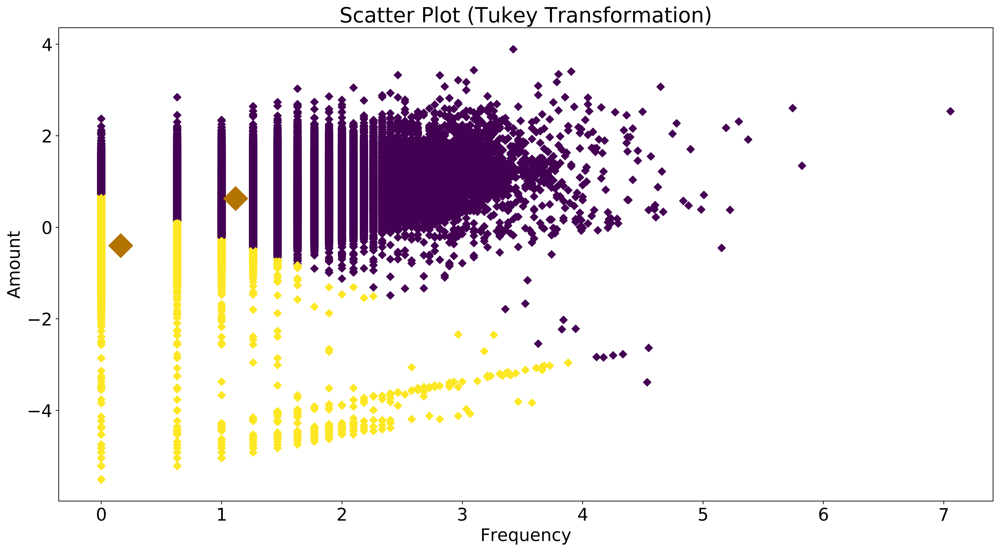

In [1315]:
Figure = pyplot.figure(figsize = (16, 9), dpi = 360)
Axis_1 = Figure.add_subplot(1, 1, 1)
pyplot.scatter(TukeyR['Frequency'], TukeyR['Monetary'], c = labels, marker = 'D')
pyplot.scatter(centroids[:, 0], centroids[:, 1], marker = 'D', c = '#B27300', s = 360)
pyplot.title('Scatter Plot (Tukey Transformation)')
pyplot.xlabel('Frequency')
pyplot.ylabel('Amount')
Figure.tight_layout()
pyplot.savefig('8T (2)', dpi = 360)

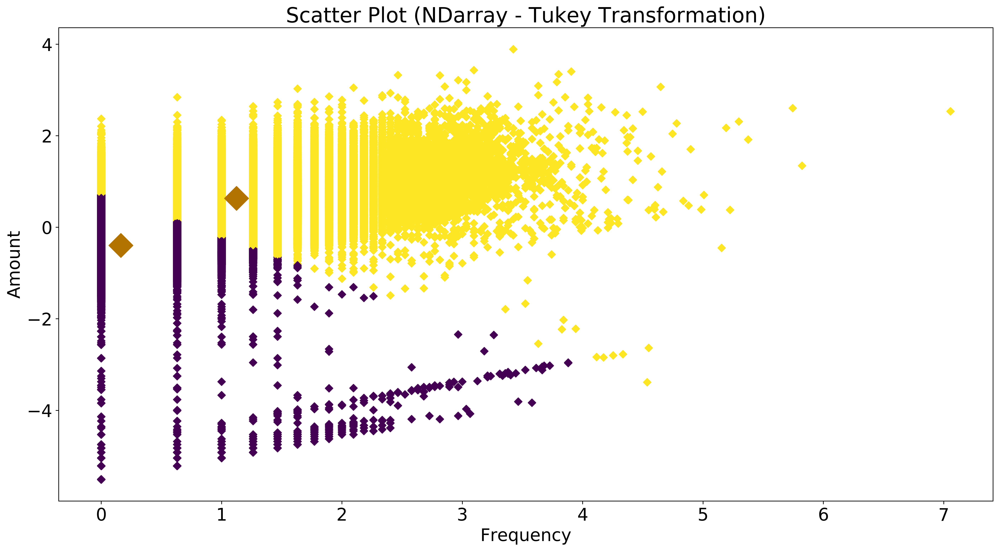

In [1316]:
Figure = pyplot.figure(figsize = (16, 9), dpi = 360)
Axis_1 = Figure.add_subplot(1, 1, 1)
pyplot.scatter(TukeyR['Frequency'], TukeyR['Monetary'], c = label, marker = 'D')
pyplot.scatter(centroid[:, 0], centroid[:, 1], marker = 'D', c = '#B27300', s = 360)
pyplot.title('Scatter Plot (NDarray - Tukey Transformation)')
pyplot.xlabel('Frequency')
pyplot.ylabel('Amount')
Figure.tight_layout()
pyplot.savefig('9T (2)', dpi = 360)

In [282]:
centroids

array([[ 1.11602835,  0.6298437 ],
       [ 0.16046744, -0.39967544]])

In [1320]:
centroid

array([[ 0.16267169, -0.39479287],
       [ 1.12332139,  0.6337778 ]])

In [290]:
Cluster_1 = Data[labels == 0]

In [289]:
Cluster_1N = Data[label == 1]

In [288]:
Cluster_2 = Data[labels == 1]

In [287]:
Cluster_2N = Data[label == 0]

In [305]:
Cluster_1.describe()

,Frequency,Monetary
count,118089.000000,1.180890e+05
mean,4.670418,3.786220e+06
std,9.296293,1.644184e+07
min,1.000000,1.460000e+02
25%,2.000000,7.787000e+05
50%,3.000000,1.743354e+06
75%,5.000000,3.889185e+06
max,2326.000000,3.779790e+09


In [330]:
sum(Cluster_1.Frequency)

551525

In [332]:
sum(Cluster_1.Monetary)

447110949587.0

In [306]:
Cluster_1N.describe()

,Frequency,Monetary
count,117267.000000,1.172670e+05
mean,4.690322,3.805027e+06
std,9.325525,1.649767e+07
min,1.000000,1.460000e+02
25%,2.000000,7.848075e+05
50%,3.000000,1.750000e+06
75%,5.000000,3.903850e+06
max,2326.000000,3.779790e+09


In [331]:
sum(Cluster_1N.Frequency)

550020

In [333]:
sum(Cluster_1N.Monetary)

446204057122.0

In [1325]:
Cluster_2.describe()

,Frequency,Monetary
count,181911.000000,1.819110e+05
mean,1.289570,3.227004e+05
std,0.846489,4.038305e+05
min,1.000000,1.000000e+00
25%,1.000000,7.500000e+04
50%,1.000000,1.781000e+05
75%,1.000000,3.899000e+05
max,71.000000,2.158199e+06


In [334]:
sum(Cluster_2.Frequency)

234587

In [335]:
sum(Cluster_2.Monetary)

58702760967.0

In [1337]:
Cluster_2N.describe()

,Frequency,Monetary
count,182733.000000,1.827330e+05
mean,1.292005,3.262118e+05
std,0.847072,4.101519e+05
min,1.000000,1.000000e+00
25%,1.000000,7.520000e+04
50%,1.000000,1.797000e+05
75%,1.000000,3.940000e+05
max,71.000000,2.223000e+06


In [337]:
sum(Cluster_2N.Frequency)

236092

In [336]:
sum(Cluster_2N.Monetary)

59609653432.0

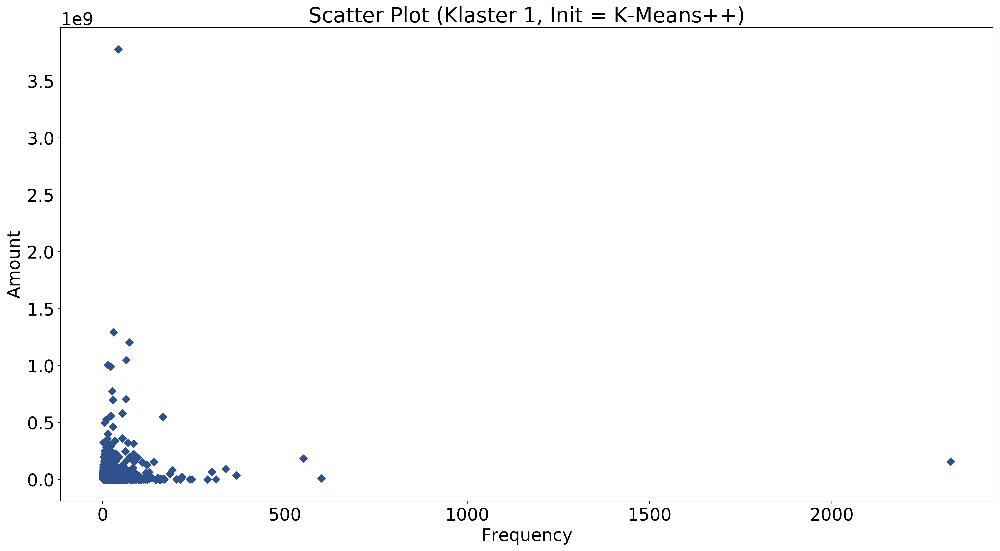

In [1395]:
Figure = pyplot.figure(figsize = (16, 9), dpi = 360)
Axis_1 = Figure.add_subplot(1, 1, 1)
pyplot.scatter(Cluster_1['Frequency'], Cluster_1['Monetary'], c = '#2F528F', marker = 'D')
pyplot.title('Scatter Plot (Klaster 1, Init = K-Means++)')
pyplot.xlabel('Frequency')
pyplot.ylabel('Amount')

Figure.tight_layout()
pyplot.savefig('10T - 1', dpi = 360)

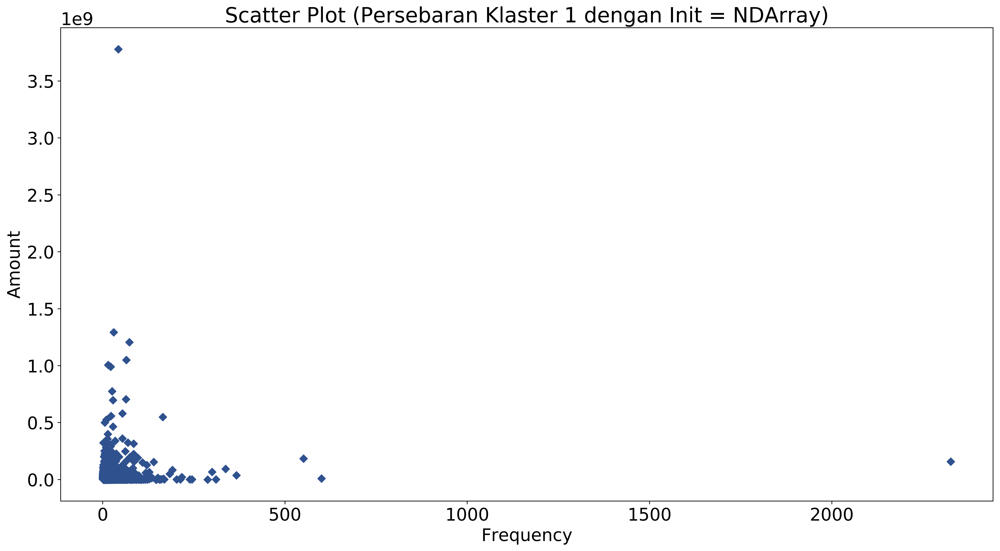

In [1334]:
Figure = pyplot.figure(figsize = (16, 9), dpi = 360)
Axis_1 = Figure.add_subplot(1, 1, 1)
pyplot.scatter(Cluster_1N['Frequency'], Cluster_1N['Monetary'], c = '#2F528F', marker = 'D')
pyplot.title('Scatter Plot (Persebaran Klaster 1 dengan Init = NDArray)')
pyplot.xlabel('Frequency')
pyplot.ylabel('Amount')

Figure.tight_layout()
pyplot.savefig('10T - 1N', dpi = 360)

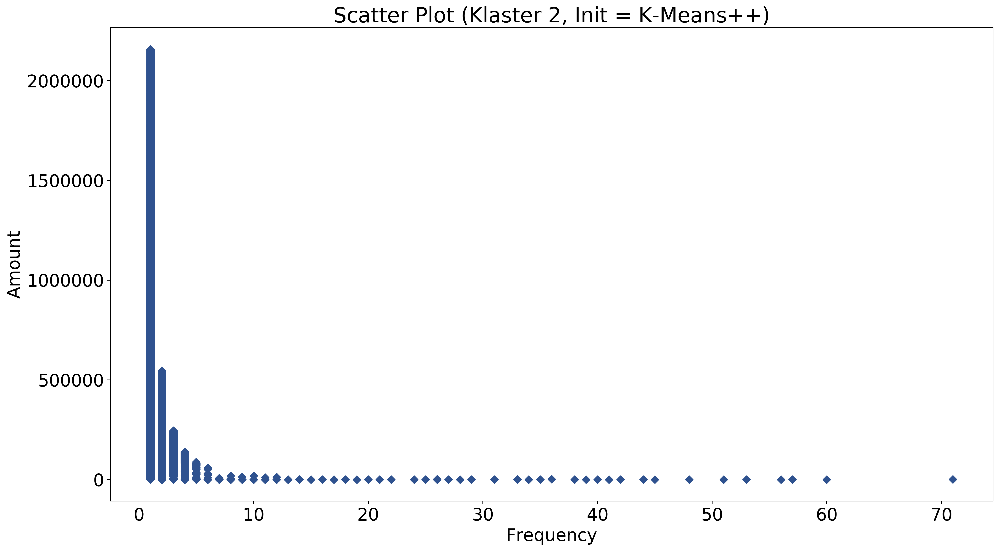

In [1396]:
Figure = pyplot.figure(figsize = (16, 9), dpi = 360)
Axis_1 = Figure.add_subplot(1, 1, 1)
pyplot.scatter(Cluster_2['Frequency'], Cluster_2['Monetary'], c = '#2F528F', marker = 'D')
pyplot.title('Scatter Plot (Klaster 2, Init = K-Means++)')
pyplot.xlabel('Frequency')
pyplot.ylabel('Amount')

Figure.tight_layout()
pyplot.savefig('10T - 2', dpi = 360)

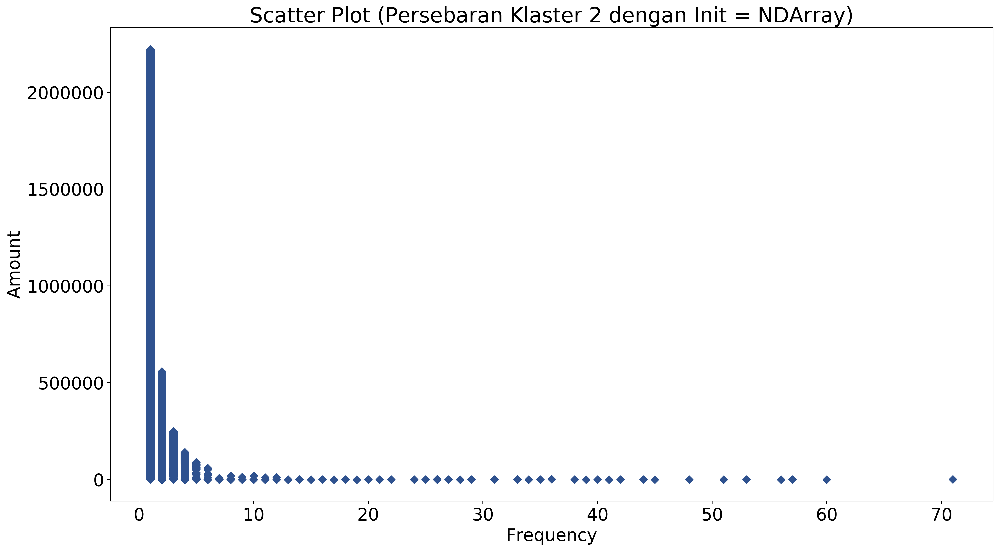

In [1338]:
Figure = pyplot.figure(figsize = (16, 9), dpi = 360)
Axis_1 = Figure.add_subplot(1, 1, 1)
pyplot.scatter(Cluster_2N['Frequency'], Cluster_2N['Monetary'], c = '#2F528F', marker = 'D')
pyplot.title('Scatter Plot (Persebaran Klaster 2 dengan Init = NDArray)')
pyplot.xlabel('Frequency')
pyplot.ylabel('Amount')

Figure.tight_layout()
pyplot.savefig('10T - 2N', dpi = 360)

In [327]:
Cluster_1.Frequency.value_counts()

2       25662
3       23388
4       16168
1       14257
5       10724
6        7063
7        4851
8        3483
9        2529
10       1953
11       1496
12       1102
13        887
14        726
15        581
16        447
17        365
18        281
19        235
20        195
21        191
22        161
23        142
25        124
24        107
26         89
28         73
27         67
30         52
29         48
        ...  
169         1
111         1
100         1
157         1
93          1
288         1
156         1
97          1
155         1
91          1
161         1
217         1
89          1
99          1
600         1
2326        1
109         1
151         1
165         1
86          1
213         1
103         1
167         1
551         1
146         1
337         1
94          1
107         1
300         1
191         1
Name: Frequency, Length: 137, dtype: int64

In [1352]:
Cluster_1N.Frequency.value_counts()

2       25261
3       23307
4       16132
1       13956
5       10721
6        7063
7        4851
8        3483
9        2529
10       1953
11       1496
12       1102
13        887
14        726
15        581
16        447
17        365
18        281
19        235
20        195
21        191
22        161
23        142
25        124
24        107
26         89
28         73
27         67
30         52
29         48
        ...  
169         1
111         1
100         1
157         1
93          1
288         1
156         1
97          1
155         1
91          1
161         1
217         1
89          1
99          1
600         1
2326        1
109         1
151         1
165         1
86          1
213         1
103         1
167         1
551         1
146         1
337         1
94          1
107         1
300         1
191         1
Name: Frequency, Length: 137, dtype: int64

In [1342]:
Cluster_1.Monetary.value_counts()

10000000.0    1041
5000000.0      627
3000000.0      617
4000000.0      408
2500000.0      337
3500000.0      234
2800000.0      227
6000000.0      183
2300000.0      166
2200000.0      164
2400000.0      161
2799000.0      146
7000000.0      143
3600000.0      140
2600000.0      132
2700000.0      130
4500000.0      130
8000000.0      121
20000000.0     120
1000000.0      109
3999000.0      105
3700000.0      102
600000.0        98
700000.0        96
2900000.0       96
3100000.0       95
3400000.0       95
3900000.0       89
3800000.0       88
5500000.0       83
              ... 
2073930.0        1
999969.0         1
1213500.0        1
2547250.0        1
1999924.0        1
1213491.0        1
1009400.0        1
3227040.0        1
5902500.0        1
368905.0         1
5109370.0        1
11804939.0       1
1999900.0        1
3475500.0        1
10408650.0       1
2426920.0        1
1475600.0        1
47219178.0       1
1213445.0        1
9707540.0        1
2951164.0        1
24334500.0  

In [1353]:
Cluster_1N.Monetary.value_counts()

10000000.0    1041
5000000.0      627
3000000.0      617
4000000.0      408
2500000.0      337
3500000.0      234
2800000.0      227
6000000.0      183
2300000.0      166
2400000.0      161
2799000.0      146
7000000.0      143
3600000.0      140
2600000.0      132
2700000.0      130
4500000.0      130
8000000.0      121
20000000.0     120
1000000.0      109
3999000.0      105
3700000.0      102
600000.0        98
2900000.0       96
700000.0        96
3100000.0       95
3400000.0       95
3900000.0       89
3800000.0       88
5500000.0       83
3200000.0       83
              ... 
4000010.0        1
7999999.0        1
2822790.0        1
3212376.0        1
2951400.0        1
1737843.0        1
1999983.0        1
3085289.0        1
7999900.0        1
606770.0         1
1737824.0        1
2427070.0        1
1999964.0        1
3475616.0        1
5109370.0        1
1737806.0        1
1172100.0        1
1742800.0        1
434450.0         1
2073930.0        1
999969.0         1
1213500.0   

In [1341]:
Cluster_2.Frequency.value_counts()

1     140997
2      33093
3       6323
4       1167
5         93
6         52
8         31
7         29
9         21
10        13
12        10
14        10
11         9
13         6
17         4
19         4
24         3
15         3
18         3
20         3
26         3
21         2
22         2
71         2
25         2
41         2
56         2
34         2
38         2
57         1
53         1
51         1
48         1
45         1
44         1
42         1
60         1
40         1
27         1
36         1
35         1
16         1
33         1
31         1
29         1
28         1
39         1
Name: Frequency, dtype: int64

In [1354]:
Cluster_2N.Frequency.value_counts()

1     141298
2      33494
3       6404
4       1203
5         96
6         52
8         31
7         29
9         21
10        13
12        10
14        10
11         9
13         6
17         4
19         4
24         3
15         3
18         3
20         3
26         3
21         2
22         2
71         2
25         2
41         2
56         2
34         2
38         2
57         1
53         1
51         1
48         1
45         1
44         1
42         1
60         1
40         1
27         1
36         1
35         1
16         1
33         1
31         1
29         1
28         1
39         1
Name: Frequency, dtype: int64

In [1343]:
Cluster_2.Monetary.value_counts()

100000.0     2218
1000000.0    1995
200000.0     1772
500000.0     1600
50000.0      1488
300000.0     1198
2000000.0    1117
150000.0     1035
30000.0       921
40000.0       833
400000.0      797
250000.0      781
20000.0       764
1500000.0     638
350000.0      502
20500.0       500
600000.0      493
80000.0       446
700000.0      435
25000.0       435
90000.0       418
21000.0       405
120000.0      403
70000.0       403
800000.0      374
450000.0      347
60000.0       342
22000.0       334
2.0           329
220000.0      320
             ... 
338450.0        1
469524.0        1
676680.0        1
234705.0        1
676670.0        1
938800.0        1
234640.0        1
676420.0        1
999040.0        1
469294.0        1
338236.0        1
338249.0        1
676500.0        1
117332.0        1
338260.0        1
216125.0        1
234670.0        1
555800.0        1
234671.0        1
42284.0         1
1391000.0       1
1877400.0       1
169140.0        1
58670.0         1
338296.0  

In [1355]:
Cluster_2N.Monetary.value_counts()

100000.0     2218
1000000.0    1995
200000.0     1772
500000.0     1600
50000.0      1488
300000.0     1198
2000000.0    1117
150000.0     1035
30000.0       921
40000.0       833
400000.0      797
250000.0      781
20000.0       764
1500000.0     638
350000.0      502
20500.0       500
600000.0      493
80000.0       446
700000.0      435
25000.0       435
90000.0       418
21000.0       405
120000.0      403
70000.0       403
800000.0      374
450000.0      347
60000.0       342
22000.0       334
2.0           329
220000.0      320
             ... 
338260.0        1
629400.0        1
169040.0        1
234513.0        1
169002.0        1
234515.0        1
117258.0        1
66747.0         1
171269.0        1
318150.0        1
117260.0        1
156775.0        1
938100.0        1
526548.0        1
338001.0        1
370350.0        1
338018.0        1
338075.0        1
135230.0        1
676058.0        1
235835.0        1
169021.0        1
58640.0         1
36601.0         1
1207000.0 

In [291]:
Cl1_25 = Cluster_1.where(Cluster_1.Frequency <= 25) 

In [1345]:
Cl1_25.describe()

,Frequency,Monetary
count,117118.000000,1.171180e+05
mean,4.302362,3.554224e+06
std,3.474865,8.879060e+06
min,1.000000,1.251200e+04
25%,2.000000,7.756425e+05
50%,3.000000,1.727200e+06
75%,5.000000,3.839500e+06
max,25.000000,1.005661e+09


In [292]:
Cl1_25N = Cluster_1N.where(Cluster_1N.Frequency <= 25) 

In [1368]:
Cl1_25N.describe()

,Frequency,Monetary
count,116296.00000,1.162960e+05
mean,4.31983,3.571547e+06
std,3.48023,8.907707e+06
min,1.00000,1.251200e+04
25%,2.00000,7.819078e+05
50%,3.00000,1.733500e+06
75%,5.00000,3.860373e+06
max,25.00000,1.005661e+09


In [293]:
Cl1_46 = Cluster_1.where(Cluster_1.Monetary <= 4670940.6)

In [1350]:
Cl1_46.describe()

,Frequency,Monetary
count,94471.000000,9.447100e+04
mean,4.271851,1.627123e+06
std,4.739614,1.177422e+06
min,1.000000,1.460000e+02
25%,2.000000,6.704650e+05
50%,3.000000,1.234851e+06
75%,5.000000,2.445900e+06
max,311.000000,4.670709e+06


In [294]:
Cl1_47N = Cluster_1N.where(Cluster_1N.Monetary <= 4700000.0)

In [1371]:
Cl1_47N.describe()

,Frequency,Monetary
count,93850.000000,9.385000e+04
mean,4.294768,1.638271e+06
std,4.772140,1.186138e+06
min,1.000000,1.460000e+02
25%,2.000000,6.774350e+05
50%,3.000000,1.242322e+06
75%,5.000000,2.468619e+06
max,311.000000,4.700000e+06


In [295]:
Cl2_5 = Cluster_2.where(Cluster_2.Frequency <= 5) 

In [1359]:
Cl2_5.describe()

,Frequency,Monetary
count,181673.000000,1.816730e+05
mean,1.273084,3.231209e+05
std,0.559289,4.039276e+05
min,1.000000,1.000000e+00
25%,1.000000,7.516500e+04
50%,1.000000,1.787350e+05
75%,1.000000,3.900000e+05
max,5.000000,2.158199e+06


In [296]:
Cl2_5N = Cluster_2N.where(Cluster_2N.Frequency <= 5) 

In [1375]:
Cl2_5N.describe()

,Frequency,Monetary
count,182495.000000,1.824950e+05
mean,1.275597,3.266349e+05
std,0.561865,4.102516e+05
min,1.000000,1.000000e+00
25%,1.000000,7.560000e+04
50%,1.000000,1.799000e+05
75%,1.000000,3.946000e+05
max,5.000000,2.223000e+06


In [297]:
Cl2_46 = Cluster_2.where(Cluster_2.Monetary <= 461900)

In [1365]:
Cl2_46.describe()

,Frequency,Monetary
count,145530.000000,145530.000000
mean,1.340459,160487.814409
std,0.929018,119666.396509
min,1.000000,1.000000
25%,1.000000,59700.000000
50%,1.000000,127900.000000
75%,2.000000,240000.000000
max,71.000000,461900.000000


In [298]:
Cl2_46N = Cluster_2N.where(Cluster_2N.Monetary <= 468412.0)

In [1378]:
Cl2_46N.describe()

,Frequency,Monetary
count,146186.000000,146186.000000
mean,1.342475,161645.994685
std,0.929344,120826.924237
min,1.000000,1.000000
25%,1.000000,60000.000000
50%,1.000000,128525.000000
75%,2.000000,242000.000000
max,71.000000,468400.000000


In [299]:
Figure = pyplot.figure(figsize = (24, 18), dpi = 360)
Axis_1 = Figure.add_subplot(2, 2, 1)
seaborn.violinplot(y = Cluster_1['Frequency'], inner = 'box', color = '#FFA500', saturation = 1)
pyplot.title('Frequency Violin Plot (Klaster 1, Init = K-Means++)')
pyplot.ylabel('Frequency')

Axis_2 = Figure.add_subplot(2, 2, 2)
seaborn.violinplot(y = Cl1_25['Frequency'], inner = 'box', color = '#FFA500', saturation = 1)
pyplot.title('Frequency Violin Plot (Klaster 1, Init = K-Means++)')
pyplot.ylabel('Frequency')

Axis_3 = Figure.add_subplot(2, 2, 3)
seaborn.violinplot(y = Cluster_1N['Frequency'], inner = 'box', color = '#FFA500', saturation = 1)
pyplot.title('Frequency Violin Plot (Klaster 1, Init = NDArray)')
pyplot.ylabel('Frequency')

Axis_4 = Figure.add_subplot(2, 2, 4)
seaborn.violinplot(y = Cl1_25N['Frequency'], inner = 'box', color = '#FFA500', saturation = 1)
pyplot.title('Frequency Violin Plot (Klaster 1, Init = NDArray)')
pyplot.ylabel('Frequency')

Figure.tight_layout()
pyplot.savefig('11T - 1F (2 - 1)', dpi = 360)

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


In [300]:
Figure = pyplot.figure(figsize = (24, 18), dpi = 360)
Axis_1 = Figure.add_subplot(2, 2, 1)
seaborn.violinplot(y = Cluster_1['Monetary'], inner = 'box', color = '#FFA500', saturation = 1)
pyplot.title('Monetary Violin Plot (Klaster 1, Init = K-Means++)')
pyplot.ylabel('Monetary')

Axis_2 = Figure.add_subplot(2, 2, 2)
seaborn.violinplot(y = Cl1_46['Monetary'], inner = 'box', color = '#FFA500', saturation = 1)
pyplot.title('Monetary Violin Plot (Klaster 1, Init = K-Means++)')
pyplot.ylabel('Monetary')

Axis_3 = Figure.add_subplot(2, 2, 3)
seaborn.violinplot(y = Cluster_1N['Monetary'], inner = 'box', color = '#FFA500', saturation = 1)
pyplot.title('Monetary Violin Plot (Klaster 1, Init = NDArray)')
pyplot.ylabel('Monetary')

Axis_4 = Figure.add_subplot(2, 2, 4)
seaborn.violinplot(y = Cl1_47N['Monetary'], inner = 'box', color = '#FFA500', saturation = 1)
pyplot.title('Monetary Violin Plot (Klaster 1, Init = NDArray)')
pyplot.ylabel('Monetary')

Figure.tight_layout()
pyplot.savefig('11T - 1M (2 - 1)', dpi = 360)

In [301]:
Figure = pyplot.figure(figsize = (24, 18), dpi = 360)
Axis_1 = Figure.add_subplot(2, 2, 1)
seaborn.violinplot(y = Cluster_2['Frequency'], inner = 'box', color = '#FFA500', saturation = 1)
pyplot.title('Frequency Violin Plot (Klaster 2, Init = K-Means++)')
pyplot.ylabel('Frequency')

Axis_2 = Figure.add_subplot(2, 2, 2)
seaborn.violinplot(y = Cl2_5['Frequency'], inner = 'box', color = '#FFA500', saturation = 1)
pyplot.title('Frequency Violin Plot (Klaster 2, Init = K-Means++)')
pyplot.ylabel('Frequency')

Axis_3 = Figure.add_subplot(2, 2, 3)
seaborn.violinplot(y = Cluster_2N['Frequency'], inner = 'box', color = '#FFA500', saturation = 1)
pyplot.title('Frequency Violin Plot (Klaster 2, Init = NDArray)')
pyplot.ylabel('Frequency')

Axis_4 = Figure.add_subplot(2, 2, 4)
seaborn.violinplot(y = Cl2_5N['Frequency'], inner = 'box', color = '#FFA500', saturation = 1)
pyplot.title('Frequency Violin Plot (Klaster 2, Init = NDArray)')
pyplot.ylabel('Frequency')


Figure.tight_layout()
pyplot.savefig('11T - 2F (2 - 1)', dpi = 360)

In [302]:
Figure = pyplot.figure(figsize = (24, 18), dpi = 360)
Axis_1 = Figure.add_subplot(2, 2, 1)
seaborn.violinplot(y = Cluster_2['Monetary'], inner = 'box', color = '#FFA500', saturation = 1)
pyplot.title('Monetary Violin Plot (Klaster 2, Init = K-Means++)')
pyplot.ylabel('Monetary')

Axis_2 = Figure.add_subplot(2, 2, 2)
seaborn.violinplot(y = Cl2_46['Monetary'], inner = 'box', color = '#FFA500', saturation = 1)
pyplot.title('Monetary Violin Plot (Klaster 2, Init = K-Means++)')
pyplot.ylabel('Monetary')

Axis_3 = Figure.add_subplot(2, 2, 3)
seaborn.violinplot(y = Cluster_2N['Monetary'], inner = 'box', color = '#FFA500', saturation = 1)
pyplot.title('Monetary Violin Plot (Klaster 2, Init = NDArray)')
pyplot.ylabel('Monetary')

Axis_4 = Figure.add_subplot(2, 2, 4)
seaborn.violinplot(y = Cl2_46N['Monetary'], inner = 'box', color = '#FFA500', saturation = 1)
pyplot.title('Monetary Violin Plot (Klaster 2, Init = NDArray)')
pyplot.ylabel('Monetary')

Figure.tight_layout()
pyplot.savefig('11T - 2M (2 - 1)', dpi = 360)

In [319]:
Figure = pyplot.figure(figsize = (24, 18), dpi = 360)
Axis_1 = Figure.add_subplot(2, 2, 1)
pyplot.hist(Cluster_1['Frequency'], bins = 24, range = (0, 2326), color = '#2F528F')
pyplot.title('Histogram of Frequency (Klaster 1, Init = K-Means++)')
pyplot.xlabel('Frequency')
pyplot.ylabel('Count')

Axis_2 = Figure.add_subplot(2, 2, 2)
pyplot.hist(Cl1_25['Frequency'], bins = 24, range = (0, 25), color = '#2F528F')
pyplot.title('Histogram of Frequency (Klaster 1, Init = K-Means++)')
pyplot.xlabel('Frequency')
pyplot.ylabel('Count')

Axis_3 = Figure.add_subplot(2, 2, 3)
pyplot.hist(Cluster_1N['Frequency'], bins = 24, range = (0, 2326), color = '#2F528F')
pyplot.title('Histogram of Frequency (Klaster 1, Init = NDArray)')
pyplot.xlabel('Frequency')
pyplot.ylabel('Count')

Axis_4 = Figure.add_subplot(2, 2, 4)
pyplot.hist(Cl1_25N['Frequency'], bins = 24, range = (0, 25), color = '#2F528F')
pyplot.title('Histogram of Frequency (Klaster 1, Init = NDArray)')
pyplot.xlabel('Frequency')
pyplot.ylabel('Count')

Figure.tight_layout()
Figure.savefig('12T - 1F (2)', dpi = 360)

C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\histograms.py:746: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\histograms.py:747: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


In [320]:
Figure = pyplot.figure(figsize = (24, 18), dpi = 360)
Axis_1 = Figure.add_subplot(2, 2, 1)
pyplot.hist(Cluster_1['Monetary'], bins = 24, range = (0, 3779790000.0), color = '#2F528F')
pyplot.title('Histogram of Monetary (Klaster 1, Init = K-Means++)')
pyplot.xlabel('Monetary')
pyplot.ylabel('Count')

Axis_2 = Figure.add_subplot(2, 2, 2)
pyplot.hist(Cl1_46['Monetary'], bins = 24, range = (0, 4670940.6), color = '#2F528F')
pyplot.title('Histogram of Monetary (Klaster 1, Init = K-Means++)')
pyplot.xlabel('Monetary')
pyplot.ylabel('Count')

Axis_3 = Figure.add_subplot(2, 2, 3)
pyplot.hist(Cluster_1N['Monetary'], bins = 24, range = (0, 3779790000.0), color = '#2F528F')
pyplot.title('Histogram of Monetary (Klaster 1, Init = NDArray)')
pyplot.xlabel('Monetary')
pyplot.ylabel('Count')

Axis_4 = Figure.add_subplot(2, 2, 4)
pyplot.hist(Cl1_47N['Monetary'], bins = 24, range = (0, 4700000.0), color = '#2F528F')
pyplot.title('Histogram of Monetary (Klaster 1, Init = NDArray)')
pyplot.xlabel('Monetary')
pyplot.ylabel('Count')

Figure.tight_layout()
Figure.savefig('12T - 1M (2)', dpi = 360)

In [321]:
#I couldn't plot dy.Frequency with seaborn.kdeplot for several reason I don't know. I could either use pandas.DataFrame.plot.kde()
#which is inconvenient for a dataset with long range, or this
Figure = pyplot.figure(figsize = (24, 18), dpi = 360)
Axis_1 = Figure.add_subplot(2, 2, 1)
pyplot.hist(Cluster_2['Frequency'], bins = 24, range = (0, 71), color = '#2F528F')
pyplot.title('Histogram of Frequency (Klaster 2, Init = K-Means++)')
pyplot.xlabel('Frequency')
pyplot.ylabel('Count')

Axis_2 = Figure.add_subplot(2, 2, 2)
pyplot.hist(Cl2_5['Frequency'], bins = 6, range = (0, 5), color = '#2F528F')
pyplot.title('Histogram of Frequency (Klaster 2, Init = K-Means++)')
pyplot.xlabel('Frequency')
pyplot.ylabel('Count')

Axis_3 = Figure.add_subplot(2, 2, 3)
pyplot.hist(Cluster_2N['Frequency'], bins = 24, range = (0, 71), color = '#2F528F')
pyplot.title('Histogram of Frequency (Klaster 2, Init = NDArray)')
pyplot.xlabel('Frequency')
pyplot.ylabel('Count')

Axis_4 = Figure.add_subplot(2, 2, 4)
pyplot.hist(Cl2_5N['Frequency'], bins = 6, range = (0, 5), color = '#2F528F')
pyplot.title('Histogram of Frequency (Klaster 2, Init = NDArray)')
pyplot.xlabel('Frequency')
pyplot.ylabel('Count')

Figure.tight_layout()
Figure.savefig('12T - 2F (2)', dpi = 360)

In [323]:
Figure = pyplot.figure(figsize = (24, 18), dpi = 360)
Axis_1 = Figure.add_subplot(2, 2, 1)
pyplot.hist(Cluster_2['Monetary'], bins = 24, range = (0, 2158199.0), color = '#2F528F')
pyplot.title('Histogram of Monetary (Klaster 2, Init = K-Means++)')
pyplot.xlabel('Monetary')
pyplot.ylabel('Count')

Axis_2 = Figure.add_subplot(2, 2, 2)
pyplot.hist(Cl2_46['Monetary'], bins = 24, range = (0, 461900.0), color = '#2F528F')
pyplot.title('Histogram of Monetary (Klaster 2, Init = K-Means++)')
pyplot.xlabel('Monetary')
pyplot.ylabel('Count')

Axis_3 = Figure.add_subplot(2, 2, 3)
pyplot.hist(Cluster_2N['Monetary'], bins = 24, range = (0, 2158199.0), color = '#2F528F')
pyplot.title('Histogram of Monetary (Klaster 2, Init = NDArray)')
pyplot.xlabel('Monetary')
pyplot.ylabel('Count')

Axis_4 = Figure.add_subplot(2, 2, 4)
pyplot.hist(Cl2_46N['Monetary'], bins = 24, range = (0, 468412.0), color = '#2F528F')
pyplot.title('Histogram of Monetary (Klaster 2, Init = NDArray)')
pyplot.xlabel('Monetary')
pyplot.ylabel('Count')

Figure.tight_layout()
Figure.savefig('12T - 2M (2)', dpi = 360)